# If necessary install the below packages (libraries) before loading them
Use install.packages in terminal rather than in the notebook.

`mamba activate r432
R
install.packages()`

In [177]:
# Downstream analysis using object created by Sara Grimm
# Match the R version and important package versions used in the original analysis
# R432

library(Seurat);       # v5.0.1  
library(ggplot2);      # v3.4.4
library(dplyr);
library(viridis);
library(dittoSeq);
library(scales);
library(scCustomize)
library(tidyr)

In [178]:
# Record active package versions
packageVersion("Seurat");
packageVersion("ggplot2");        
packageVersion("dplyr");
packageVersion("viridis");
packageVersion("dittoSeq");
packageVersion("scales");
packageVersion("scCustomize");
packageVersion("tidyr");

[1] ‘5.0.1’

[1] ‘3.4.4’

[1] ‘1.1.4’

[1] ‘0.6.5’

[1] ‘1.14.3’

[1] ‘1.3.0’

[1] ‘3.0.1’

[1] ‘1.3.1’

In [179]:
# Read in the processed RDS file from Sara Grimm, which holds a seurat object with immune cells subsetted, integrated, and annotated (from 4 samples).
Adult_Srfflox_SrfKO_immune <- readRDS("/ddn/gs1/home/marquardtrm/PRcreSRF_scRNAseq_Sara/data_rds/RM-adult_SrfKO-Immune.03feb2025.rds")
Adult_Srfflox_SrfKO_immune
head(Adult_Srfflox_SrfKO_immune)

An object of class Seurat 
26486 features across 4655 samples within 1 assay 
Active assay: RNA (26486 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 3 dimensional reductions calculated: pca, integrated.rpca, umap

,orig.ident,nCount_RNA,nFeature_RNA,Sample,genotype,batch,percent.mt,percent.rp,percent.hg,S.Score,G2M.Score,Phase,old.ident,CC.Difference,seurat_clusters,broad_clusters,SR_broad_ImmGen,SR_fine_ImmGen,ImmuneSubtype
,<chr>,<dbl>,<int>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<fct>,<chr>,<chr>,<fct>
Ctrl1___AAACCCAAGGTCCCGT-1,Ctrl1,5652,2163,Ctrl1,Ctrl,1,2.813163,11.341118,0,-0.087413046,-0.16113772,G1,Ctrl1,0.073724669,0,5,Macrophages,Macrophages (MF.11C-11B+),Macrophage
Ctrl1___AAACCCACATCACCAA-1,Ctrl1,6085,2336,Ctrl1,Ctrl,1,2.678718,10.566968,0,-0.070066492,-0.04961594,G1,Ctrl1,-0.020450549,6,15,ILC,Tgd (Tgd.mat.VG2+),gammadeltaT
Ctrl1___AAACCCACATGTCAGT-1,Ctrl1,15094,4189,Ctrl1,Ctrl,1,3.186697,23.227773,0,0.795792256,0.30071105,S,Ctrl1,0.495081210,5,10,NK cells,NK cells (NK.DAP10-),ProliferatingNK
Ctrl1___AAACGCTGTTAGGGAC-1,Ctrl1,5265,2227,Ctrl1,Ctrl,1,5.963913,10.465337,0,0.002507597,0.77092168,G2M,Ctrl1,-0.768414085,10,13,DC,DC (DC.103-11B+24+),cDC1
Ctrl1___AAAGAACGTTCCCACT-1,Ctrl1,15788,4236,Ctrl1,Ctrl,1,4.826450,20.502914,0,0.536669815,0.31097436,S,Ctrl1,0.225695459,5,10,ILC,NK cells (NK.H+MCMV1),ProliferatingNK
Ctrl1___AAAGGTACACCCGTAG-1,Ctrl1,2131,1272,Ctrl1,Ctrl,1,4.411075,9.150634,0,-0.065255999,-0.06062017,G1,Ctrl1,-0.004635824,0,5,Macrophages,Macrophages (MF.11C-11B+),Macrophage
Ctrl1___AAAGGTACAGAATCGG-1,Ctrl1,5258,2080,Ctrl1,Ctrl,1,4.849753,18.181818,0,0.006645728,-0.03464015,S,Ctrl1,0.041285883,6,15,NKT,Tgd (Tgd.mat.VG2+),gammadeltaT
Ctrl1___AAATGGACAGCTTCGG-1,Ctrl1,3968,1885,Ctrl1,Ctrl,1,5.771169,16.582661,0,0.628106036,0.23055130,S,Ctrl1,0.397554733,5,10,NKT,T cells (T.8EFF.OT1.D5.VSVOVA),ProliferatingNK
Ctrl1___AACAAAGCAAGAGATT-1,Ctrl1,5992,2169,Ctrl1,Ctrl,1,3.120828,16.405207,0,-0.054819336,-0.11492390,G1,Ctrl1,0.060104561,0,5,Macrophages,Macrophages (MF.103-11B+24-),Macrophage


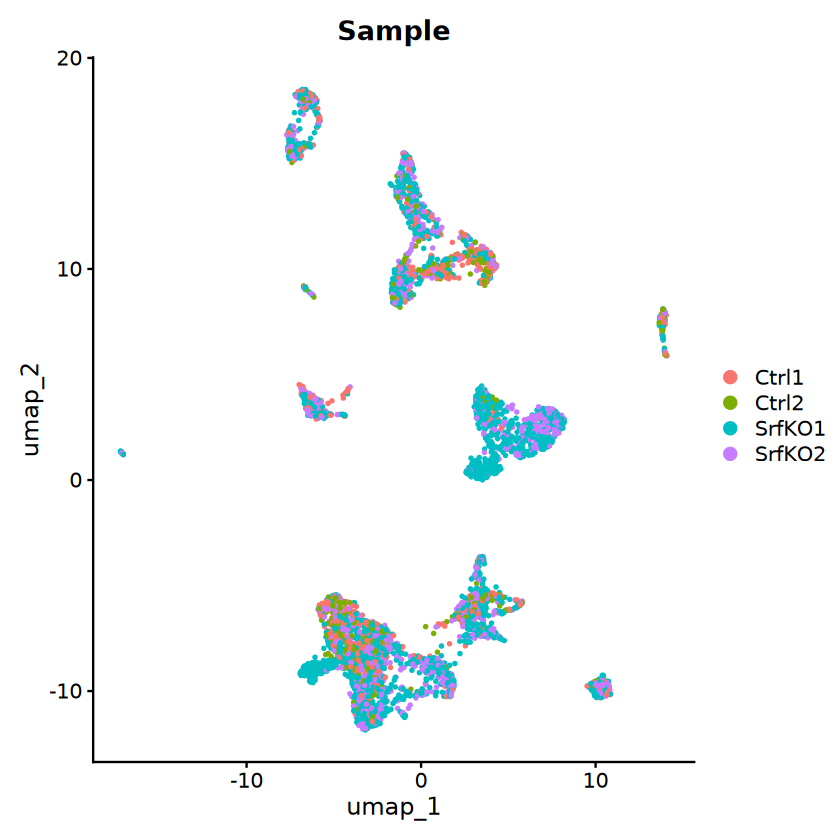

In [4]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="Sample", pt.size=0.5, reduction='umap', shuffle=TRUE);

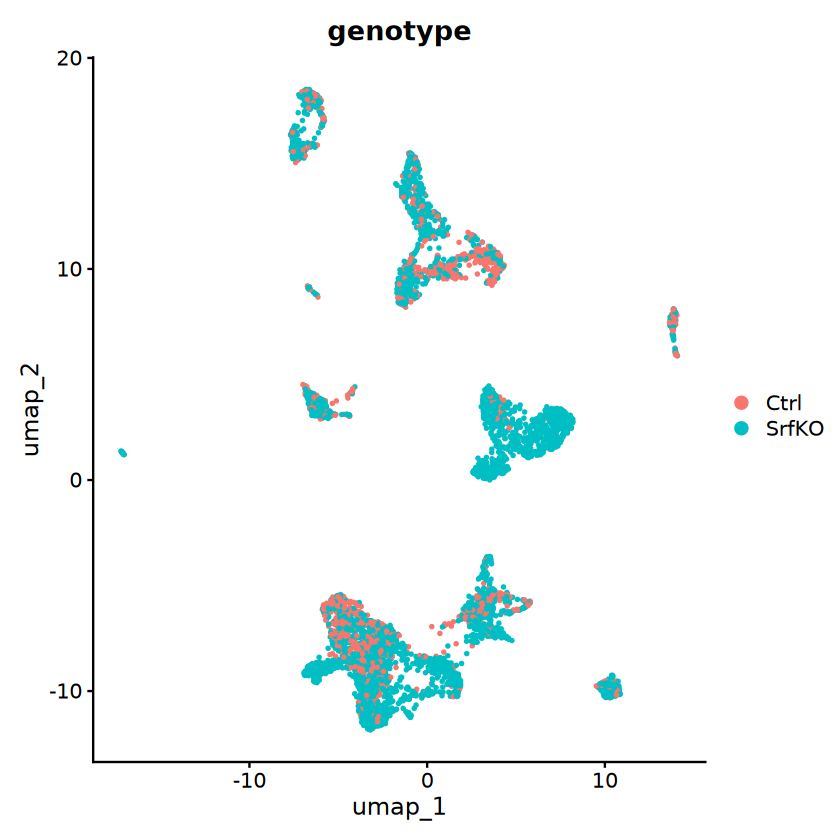

In [5]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="genotype", pt.size=0.5, reduction='umap', shuffle=TRUE);

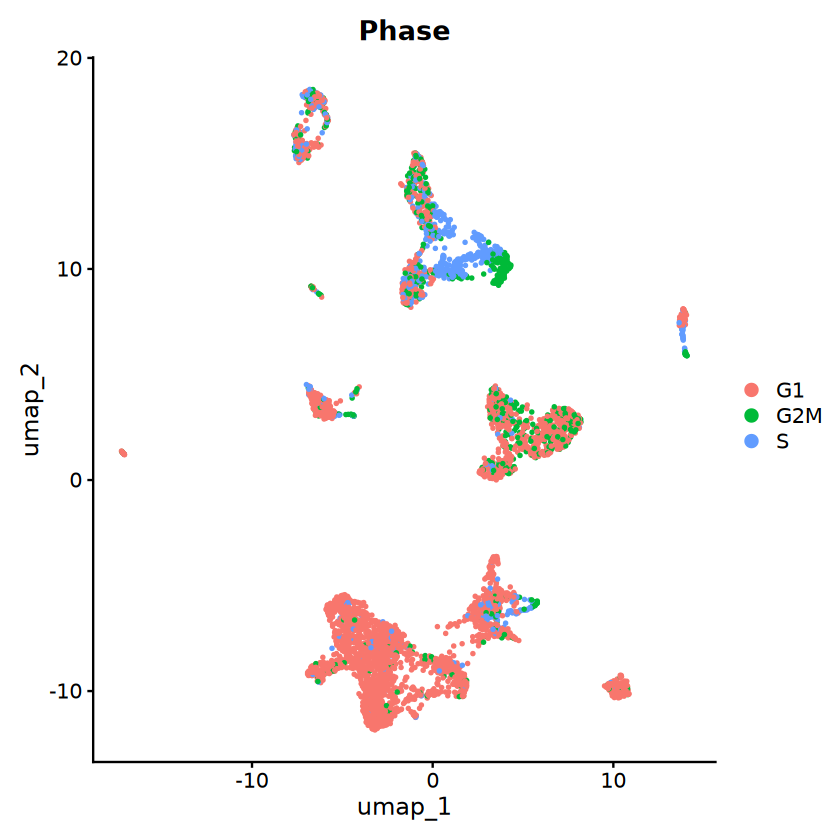

In [6]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="Phase", pt.size=0.5, reduction='umap', shuffle=TRUE)

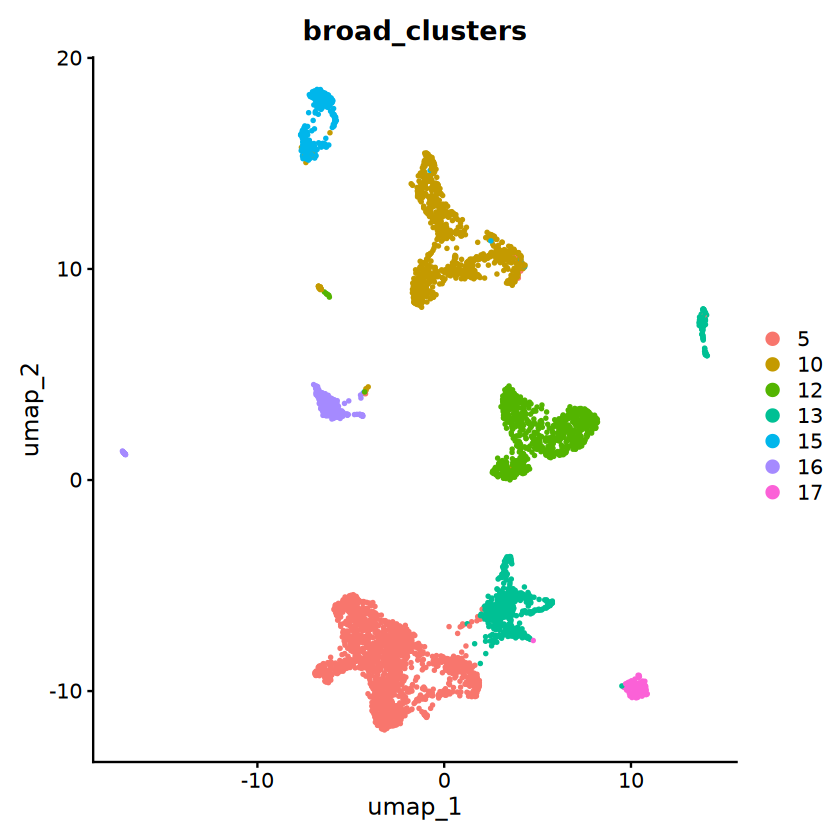

In [8]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="broad_clusters", pt.size=0.5, reduction='umap', shuffle=TRUE)

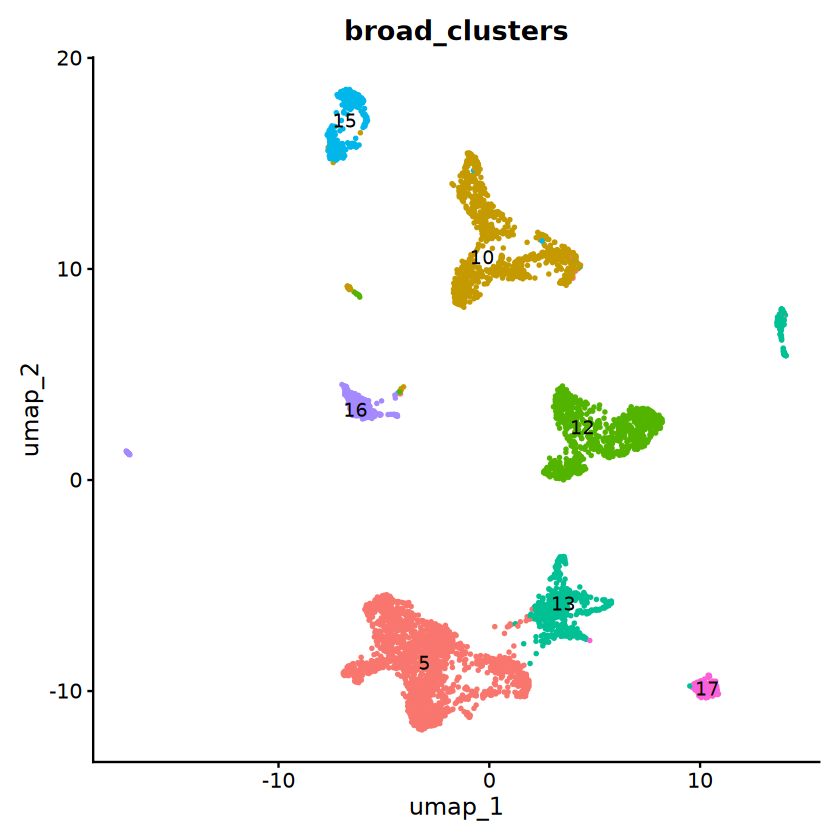

In [10]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="broad_clusters", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=TRUE
       )+NoLegend();

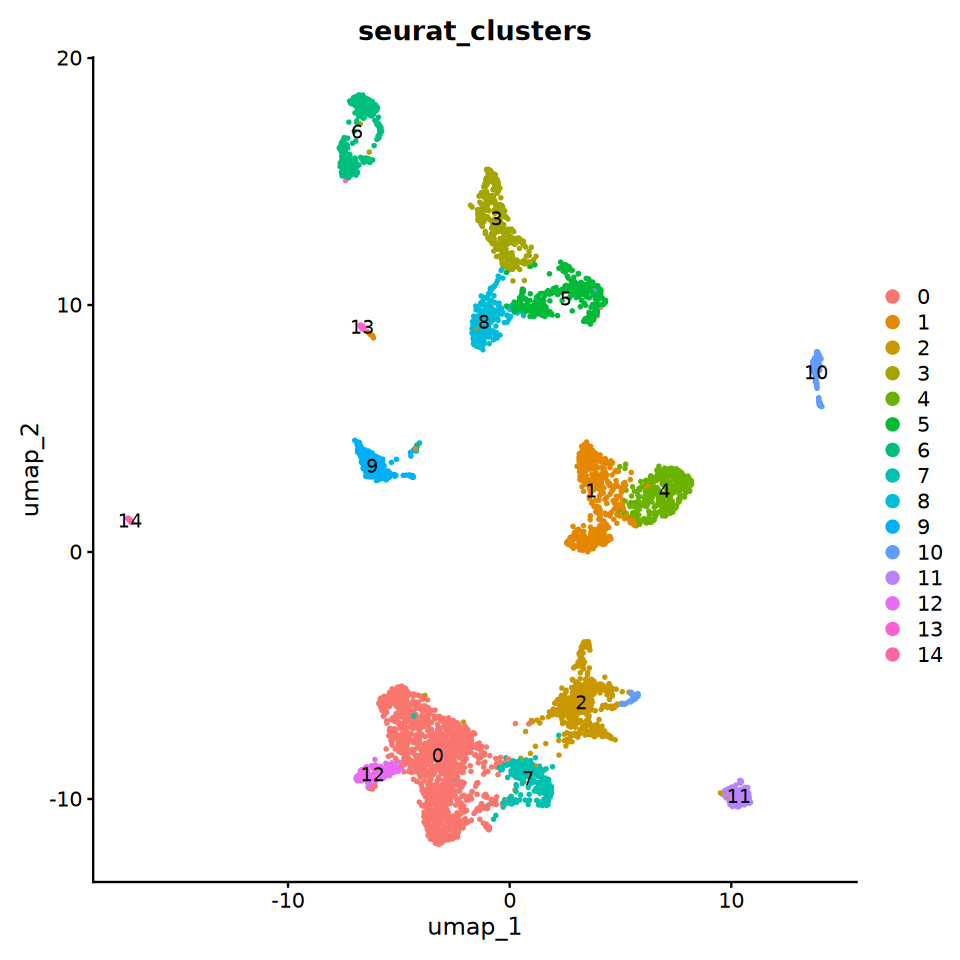

In [195]:
saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

DimPlot(Adult_Srfflox_SrfKO_immune, group.by="seurat_clusters", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=TRUE
       );

options(saved) # restore old settings

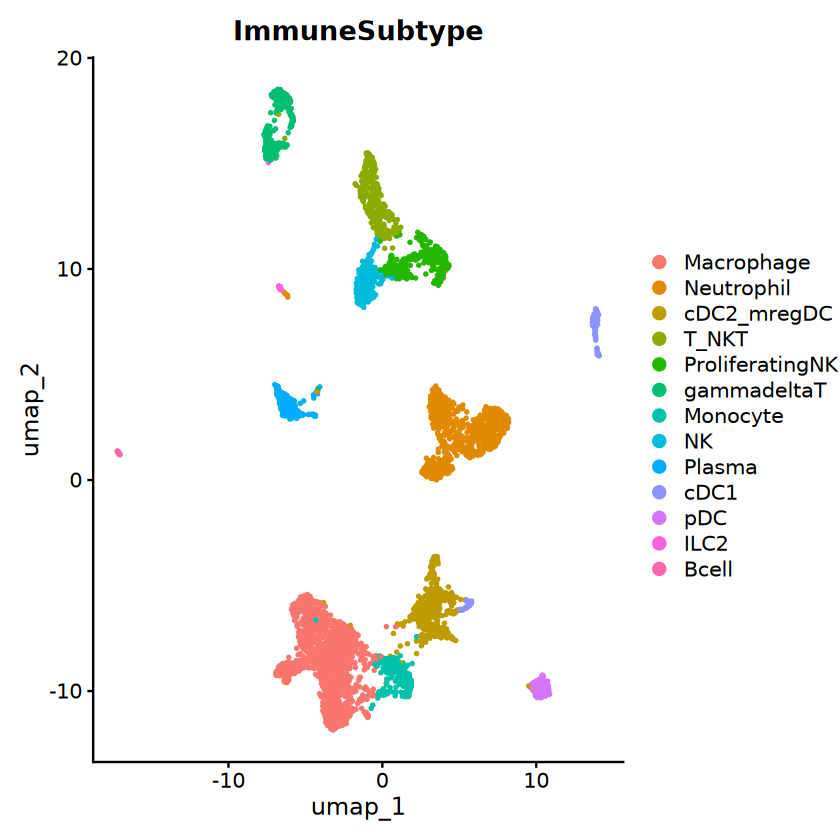

In [11]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE)

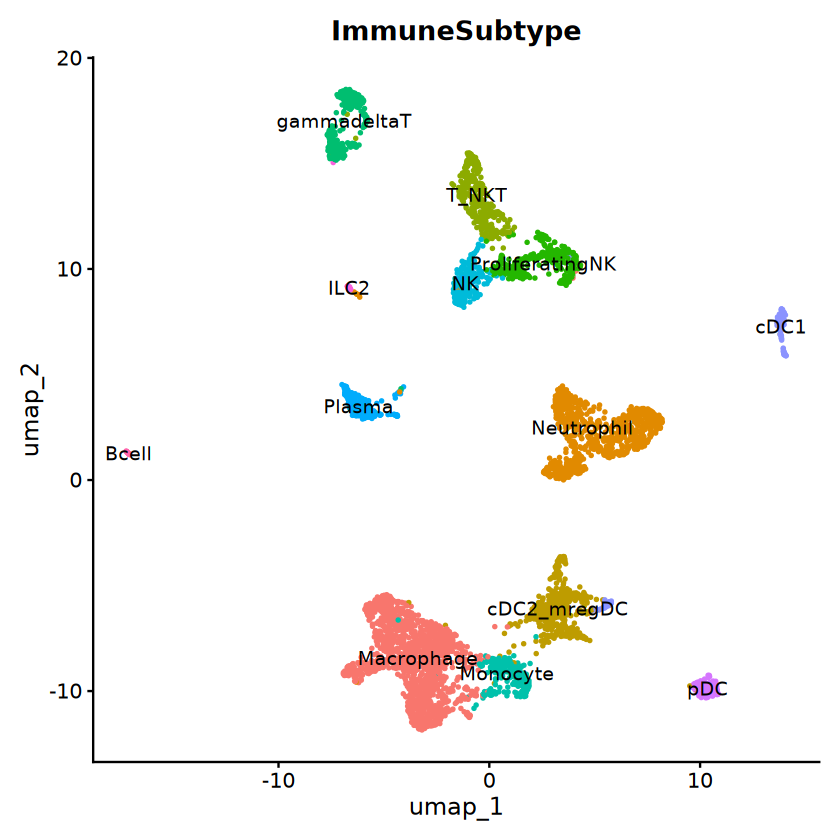

In [12]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=TRUE
       )+NoLegend();

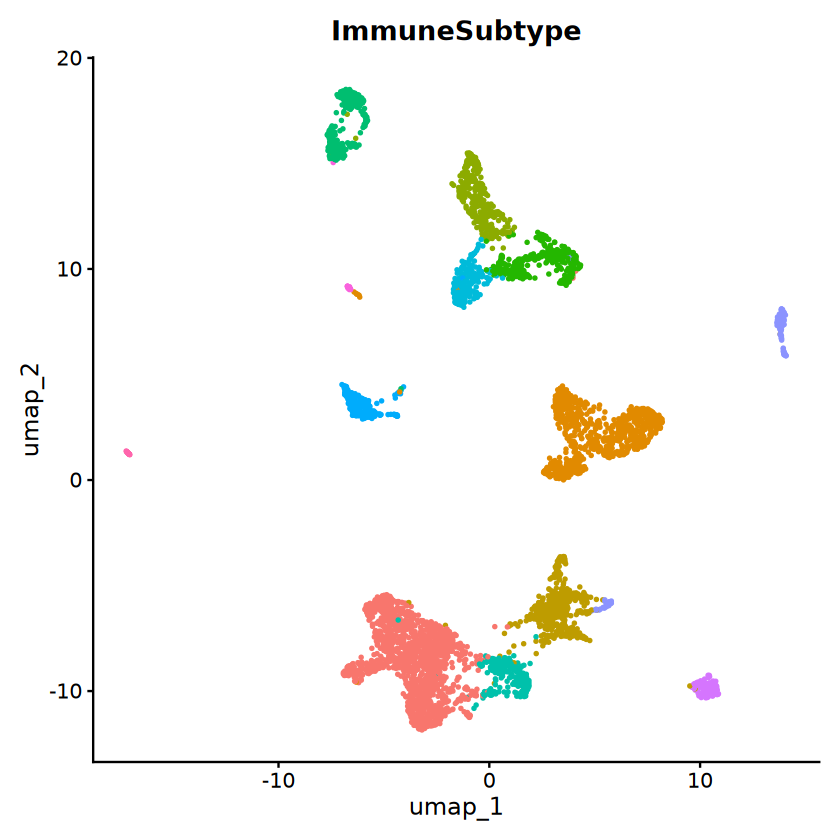

In [13]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=FALSE
       )+NoLegend();

In [14]:
png(file = "Immune_PlotBySubtype.png",
    width = 16, height = 16, units = "cm", res = 600)

DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=FALSE
       )+NoLegend();

dev.off()

pdf 
  2

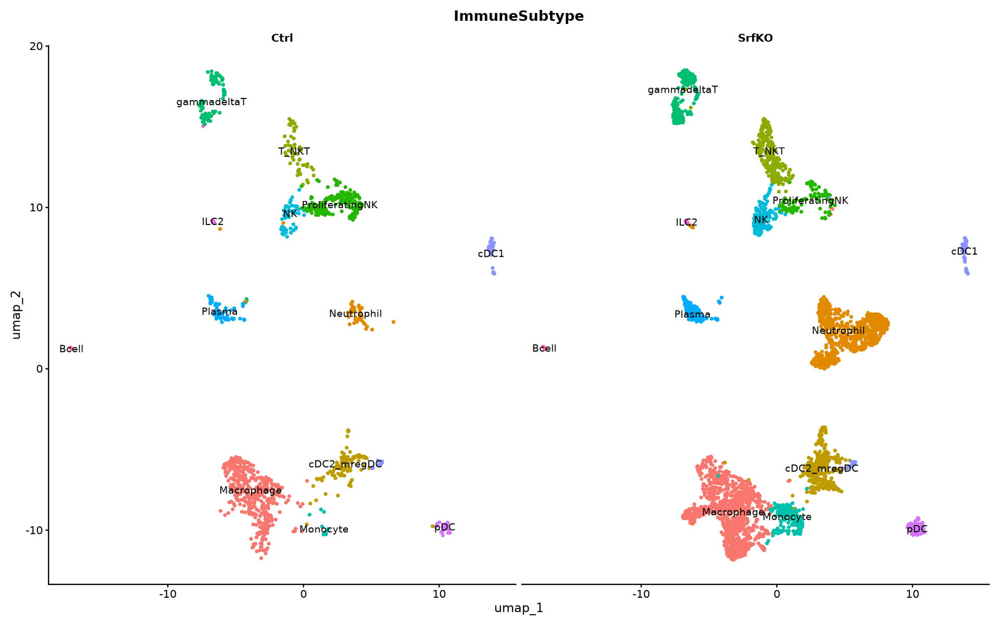

In [167]:
DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=1, reduction='umap', shuffle=TRUE,
        label=TRUE, split.by="genotype"
       )+NoLegend()

In [16]:
png(file = "Immune_PlotBySubtype_SplitByGenotype.png",
    width = 29, height = 16, units = "cm", res = 600)

DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=TRUE, split.by="genotype"
       )+NoLegend()

dev.off()

pdf 
  2

In [17]:
png(file = "Immune_PlotBySubtype_SplitByGenotype_nolabel.png",
    width = 29, height = 16, units = "cm", res = 600)

DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=0.5, reduction='umap', shuffle=TRUE,
        label=FALSE, split.by="genotype"
       )+NoLegend()

dev.off()

pdf 
  2

In [171]:
png(file = "Immune_PlotBySubtype_SplitByGenotype_nolabel_largerpt.png",
    width = 29, height = 16, units = "cm", res = 600)

DimPlot(Adult_Srfflox_SrfKO_immune, group.by="ImmuneSubtype", pt.size=1, reduction='umap', shuffle=TRUE,
        label=FALSE, split.by="genotype"
       )+NoLegend()

dev.off()

pdf 
  2

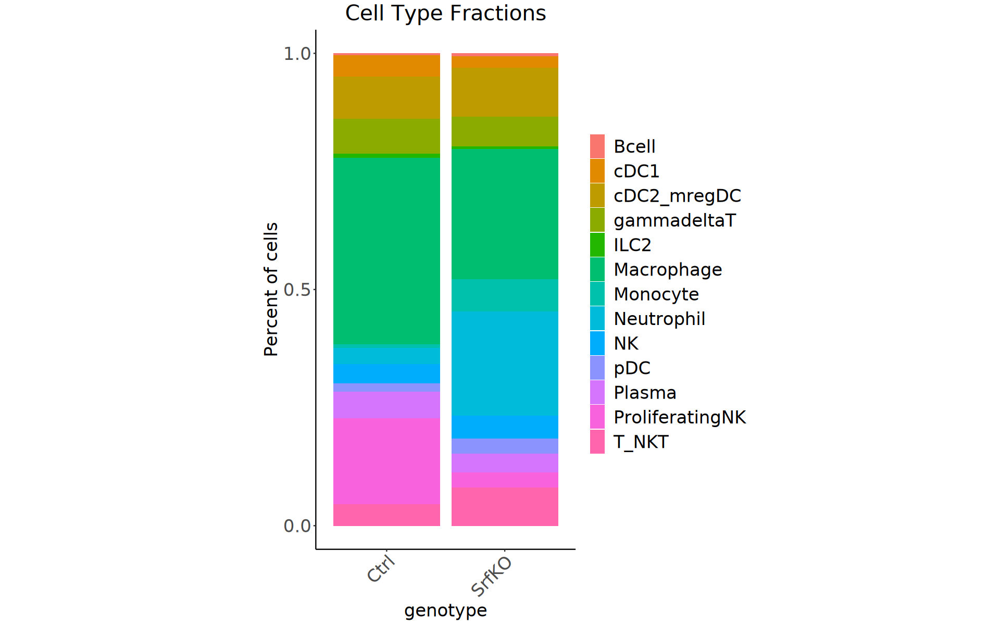

In [83]:
# Use DittoSeq to plot fraction of each cluster by genotype

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype
# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)
# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))
# Use dittoBarPlot to generate the plot with some customization

saved <- options(repr.plot.width = 16, repr.plot.height = 10) # Make the plots bigger from here on out, save old options

dittoBarPlot(Adult_Srfflox_SrfKO_immune_tmp, 
             var = "ImmuneSubtype", 
             group.by = "genotype",
             color.panel = my_color_palette, 
             main = "Cell Type Fractions") + theme(axis.text = element_text(size = 20), 
                    legend.text = element_text(size = 20), 
                    legend.key.height = unit(1, 'cm'), 
                    title = element_text(size = 20, hjust = 0.5), 
                    plot.title = element_text(hjust=0.5), 
                    aspect.ratio = 2/1)

options(saved) # restore old settings

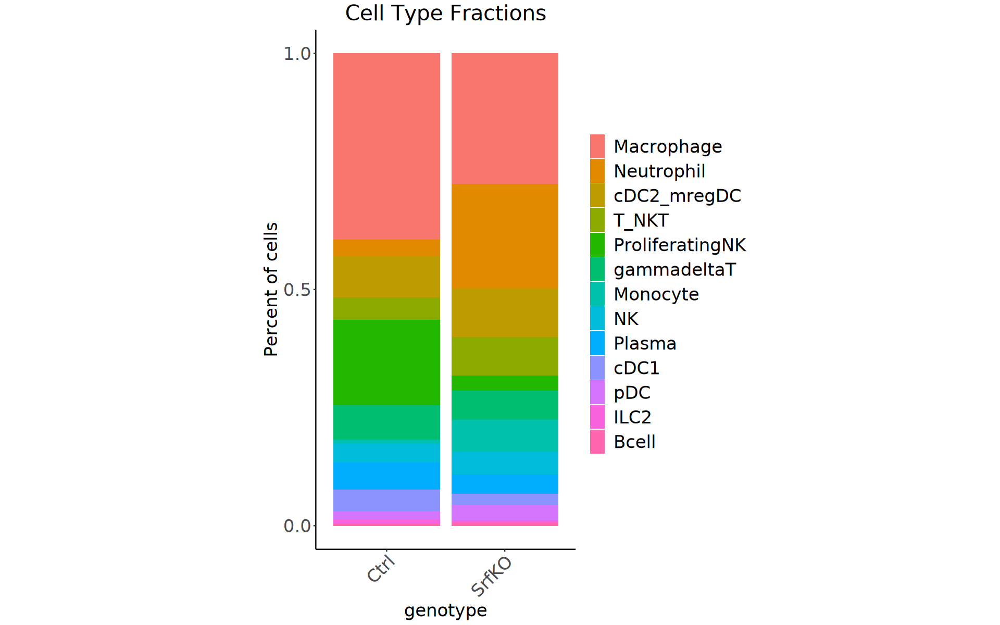

In [84]:
# Use DittoSeq to plot fraction of each cluster by genotype

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype
# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)
# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))
# Use dittoBarPlot to generate the plot with some customization

saved <- options(repr.plot.width = 16, repr.plot.height = 10) # Make the plots bigger from here on out, save old options

dittoBarPlot(Adult_Srfflox_SrfKO_immune_tmp, 
             var = "ImmuneSubtype", 
             group.by = "genotype",
             color.panel = my_color_palette,
             var.labels.reorder = c(6, 8, 3, 13, 12, 4, 7, 9, 11, 2, 10, 5, 1),
             main = "Cell Type Fractions") + theme(axis.text = element_text(size = 20), 
                    legend.text = element_text(size = 20), 
                    legend.key.height = unit(1, 'cm'), 
                    title = element_text(size = 20, hjust = 0.5), 
                    plot.title = element_text(hjust=0.5), 
                    aspect.ratio = 2/1)

options(saved) # restore old settings             


In [82]:
cluster_order

[1] "Macrophage"      "Neutrophil"      "cDC2_mregDC"     "T_NKT"          
 [5] "ProliferatingNK" "gammadeltaT"     "Monocyte"        "NK"             
 [9] "Plasma"          "cDC1"            "pDC"             "ILC2"           
[13] "Bcell"

In [70]:
levels(Adult_Srfflox_SrfKO_immune_tmp)

[1] "Macrophage"      "Neutrophil"      "cDC2_mregDC"     "T_NKT"          
 [5] "ProliferatingNK" "gammadeltaT"     "Monocyte"        "NK"             
 [9] "Plasma"          "cDC1"            "pDC"             "ILC2"           
[13] "Bcell"

In [71]:
my_color_palette

[1] "#F8766D" "#E18A00" "#BE9C00" "#8CAB00" "#24B700" "#00BE70" "#00C1AB"
 [8] "#00BBDA" "#00ACFC" "#8B93FF" "#D575FE" "#F962DD" "#FF65AC"

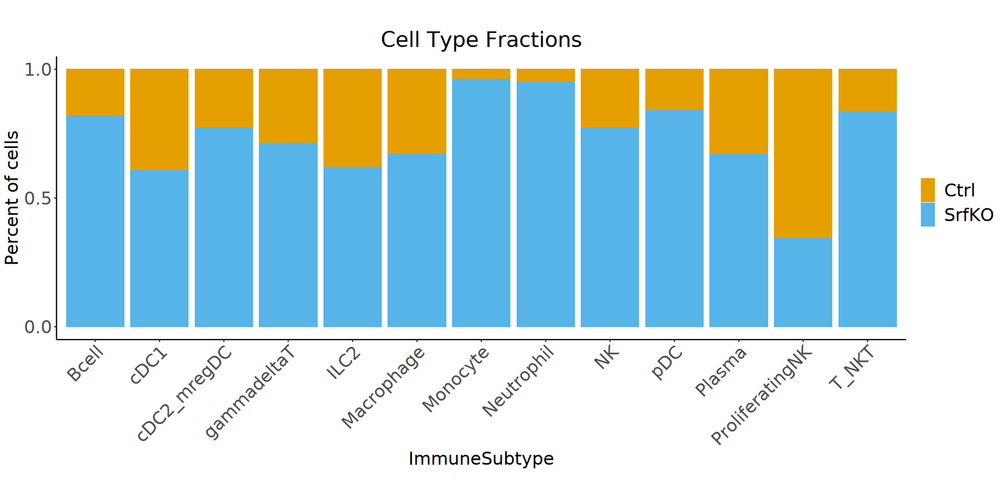

In [20]:
# Use DittoSeq to plot fraction of each cell type by genotype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

dittoBarPlot(Adult_Srfflox_SrfKO_immune_tmp, 
             var = "genotype", 
             group.by = "ImmuneSubtype", 
             main = "Cell Type Fractions") + theme(axis.text = element_text(size = 20), 
                    legend.text = element_text(size = 20), 
                    legend.key.height = unit(1, 'cm'), 
                    title = element_text(size = 20, hjust = 0.5), 
                    plot.title = element_text(hjust=0.5), 
                    aspect.ratio = 1/3)

options(saved) # restore old settings

In [19]:
# Count cells by type to compare between genotypes
cell_table <- table(Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype, Adult_Srfflox_SrfKO_immune_tmp$genotype)
cell_table

                 
                  Ctrl SrfKO
  Macrophage       469   958
  Neutrophil        40   767
  cDC2_mregDC      106   358
  T_NKT             54   278
  ProliferatingNK  215   113
  gammadeltaT       88   219
  Monocyte           9   235
  NK                49   166
  Plasma            67   137
  cDC1              54    84
  pDC               21   111
  ILC2              11    18
  Bcell              5    23

In [35]:
# Make a bar graph showing each immune subtype as a percentage of all cells by genotype (Calculated first in excel)
# help from ChIRP (GPT-4o)

# Create the dataset

ImmunePct_df <- data.frame(Immune_subtype = c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"),
  Percent_of_all_Ctrl_cells = c(2.665, 0.227, 0.602, 0.307, 1.222, 0.5, 0.051, 0.278, 0.381, 0.307, 0.119, 0.062, 0.028),
  Percent_of_all_SrfKO_cells = c(6.026, 4.824, 2.252, 1.749, 0.711, 1.377, 1.478, 1.044, 0.862, 0.528, 0.698, 0.113, 0.145))

# Print the dataframe
ImmunePct_df


Immune_subtype,Percent_of_all_Ctrl_cells,Percent_of_all_SrfKO_cells
<chr>,<dbl>,<dbl>
Macrophage,2.665,6.026
Neutrophil,0.227,4.824
cDC2_mregDC,0.602,2.252
T_NKT,0.307,1.749
ProliferatingNK,1.222,0.711
gammadeltaT,0.500,1.377
Monocyte,0.051,1.478
NK,0.278,1.044
Plasma,0.381,0.862


In [37]:
# Reshape the data using tidyr
data_long <- ImmunePct_df %>%
  pivot_longer(cols = c(Percent_of_all_Ctrl_cells, Percent_of_all_SrfKO_cells),
               names_to = "Condition", values_to = "Percent")

data_long

Immune_subtype,Condition,Percent
<chr>,<chr>,<dbl>
Macrophage,Percent_of_all_Ctrl_cells,2.665
Macrophage,Percent_of_all_SrfKO_cells,6.026
Neutrophil,Percent_of_all_Ctrl_cells,0.227
Neutrophil,Percent_of_all_SrfKO_cells,4.824
cDC2_mregDC,Percent_of_all_Ctrl_cells,0.602
cDC2_mregDC,Percent_of_all_SrfKO_cells,2.252
T_NKT,Percent_of_all_Ctrl_cells,0.307
T_NKT,Percent_of_all_SrfKO_cells,1.749
ProliferatingNK,Percent_of_all_Ctrl_cells,1.222


In [38]:
# Adjust the Condition column for better readability
data_long$Condition <- gsub("Percent_of_all_", "", data_long$Condition)
data_long$Condition <- gsub("_cells", "", data_long$Condition)
data_long

Immune_subtype,Condition,Percent
<chr>,<chr>,<dbl>
Macrophage,Ctrl,2.665
Macrophage,SrfKO,6.026
Neutrophil,Ctrl,0.227
Neutrophil,SrfKO,4.824
cDC2_mregDC,Ctrl,0.602
cDC2_mregDC,SrfKO,2.252
T_NKT,Ctrl,0.307
T_NKT,SrfKO,1.749
ProliferatingNK,Ctrl,1.222


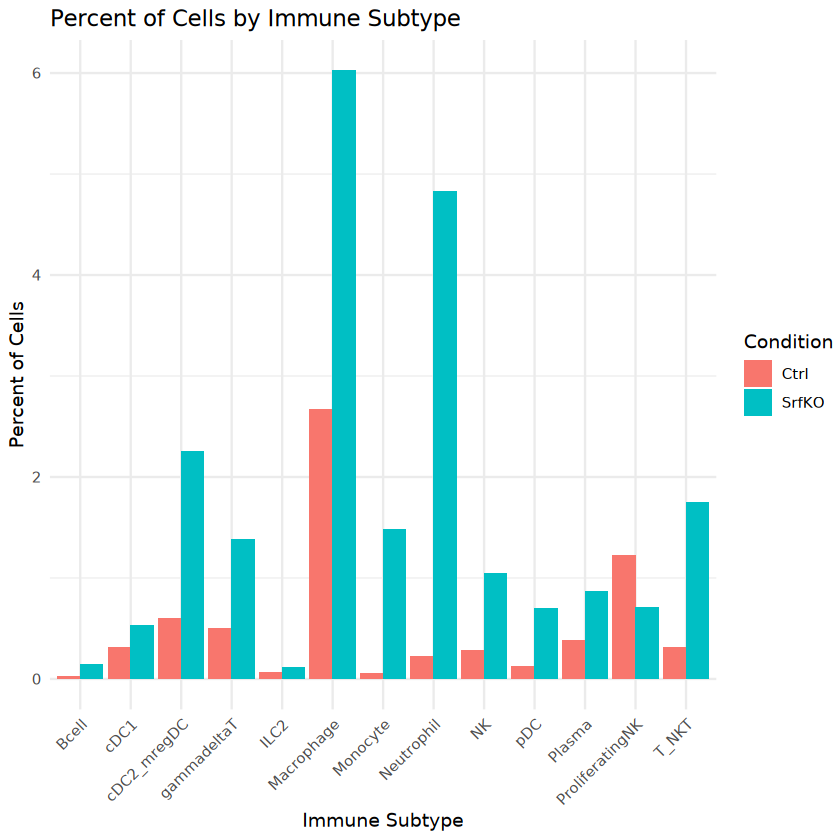

In [39]:
# Create the bar plot
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Condition)) +
  geom_bar(stat = "identity", position = "dodge") +
  theme_minimal() +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

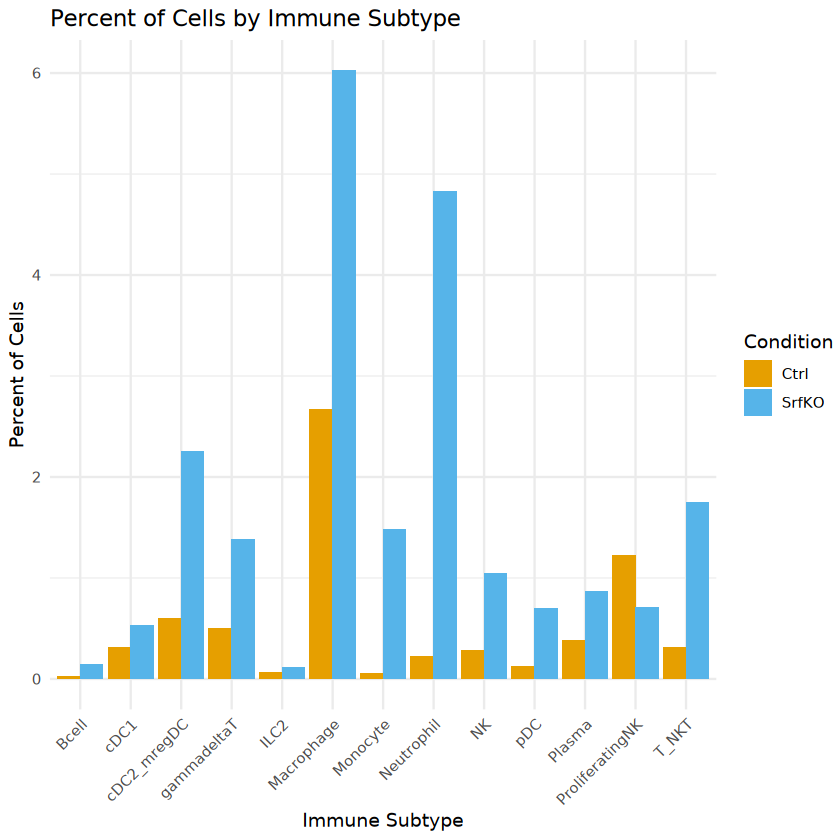

In [51]:
# Use dittoseq colorscheme

ditto_colors <- dittoColors(get.names = FALSE) # This will return a vector of hex codes

# Create the bar plot
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Condition)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = ditto_colors) +
  theme_minimal() +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))




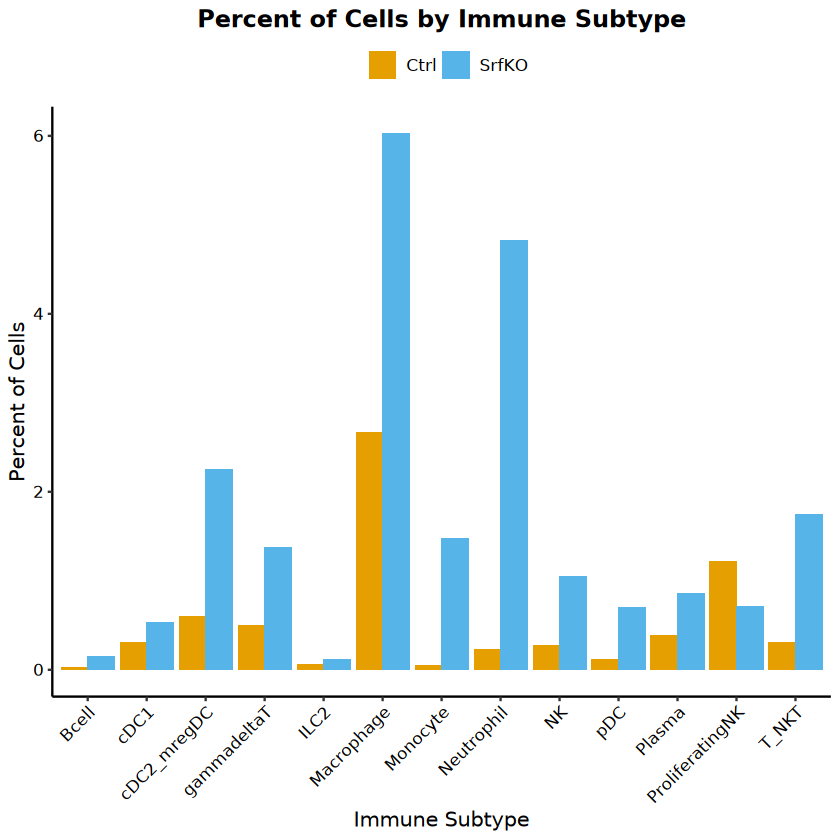

In [54]:
# Create the bar plot with Seurat-like theme and dittoseq colorscheme
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Condition)) +
  geom_bar(stat = "identity", position = "dodge") +
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "top"
  ) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = ditto_colors)  # Custom colors similar to Seurat

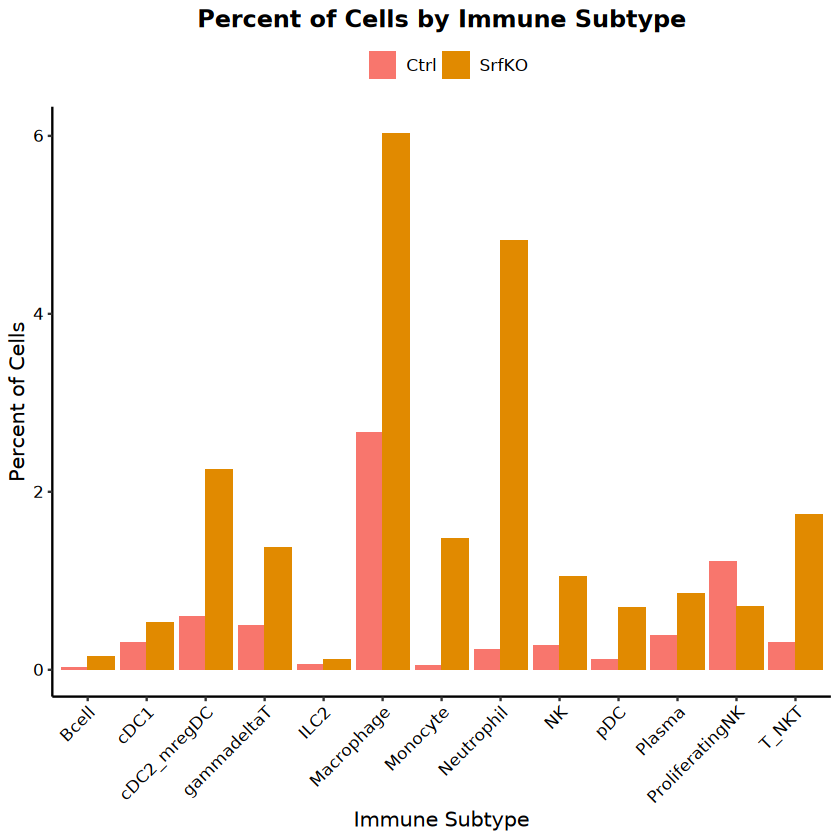

In [57]:
# now match the colors to the seurat object

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype
# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)
# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))

# Create the bar plot with Seurat-like theme and seurat object colorscheme
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Condition)) +
  geom_bar(stat = "identity", position = "dodge") +
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "top"
  ) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = my_color_palette)  # Custom colors similar to Seurat


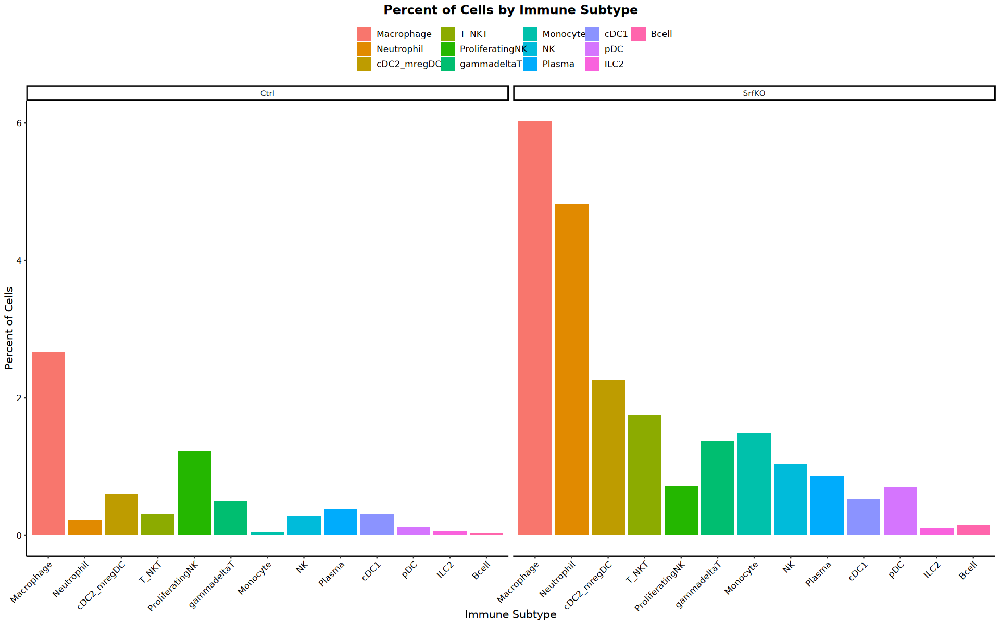

In [137]:
#Split plot and color by genotype

# reorder data_long levels to match seurat object levels
data_long$Immune_subtype <- factor(data_long$Immune_subtype, levels=c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"))

ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Immune_subtype)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.8)) +
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "top"
  ) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = scales::hue_pal()(length(unique(data_long$Immune_subtype)))) +
  facet_wrap(~ Condition)

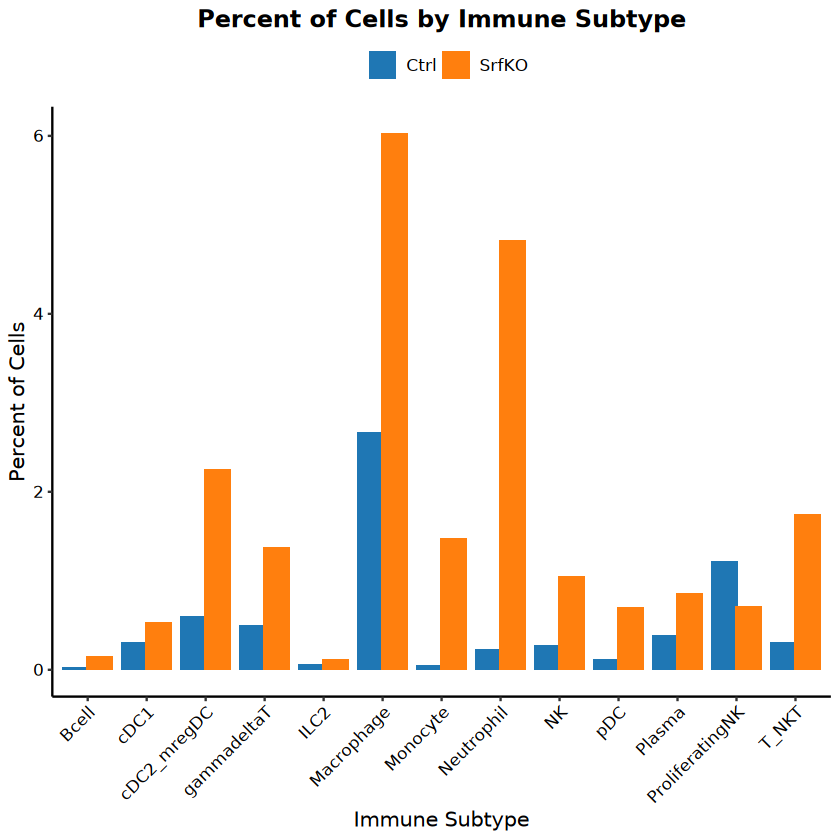

In [60]:
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Condition)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.8)) +
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "top"
  ) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = c("#1f77b4", "#ff7f0e"))  # Customize colors for conditions

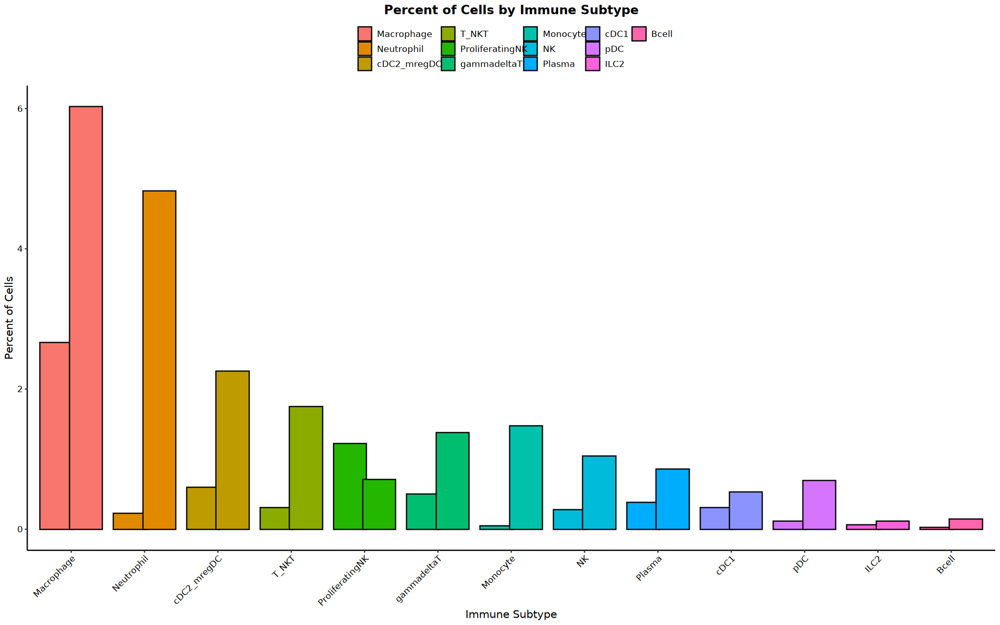

In [136]:
# now match the colors to the seurat object

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype

# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)

# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))

# reorder data_long levels to match seurat object levels
data_long$Immune_subtype <- factor(data_long$Immune_subtype, levels=c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"))

#Plot
ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Immune_subtype)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.8)) + 
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "top"
  ) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = my_color_palette) +
  aes(group = Condition) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.8), color = "black", linewidth = 0.5) #black outlines

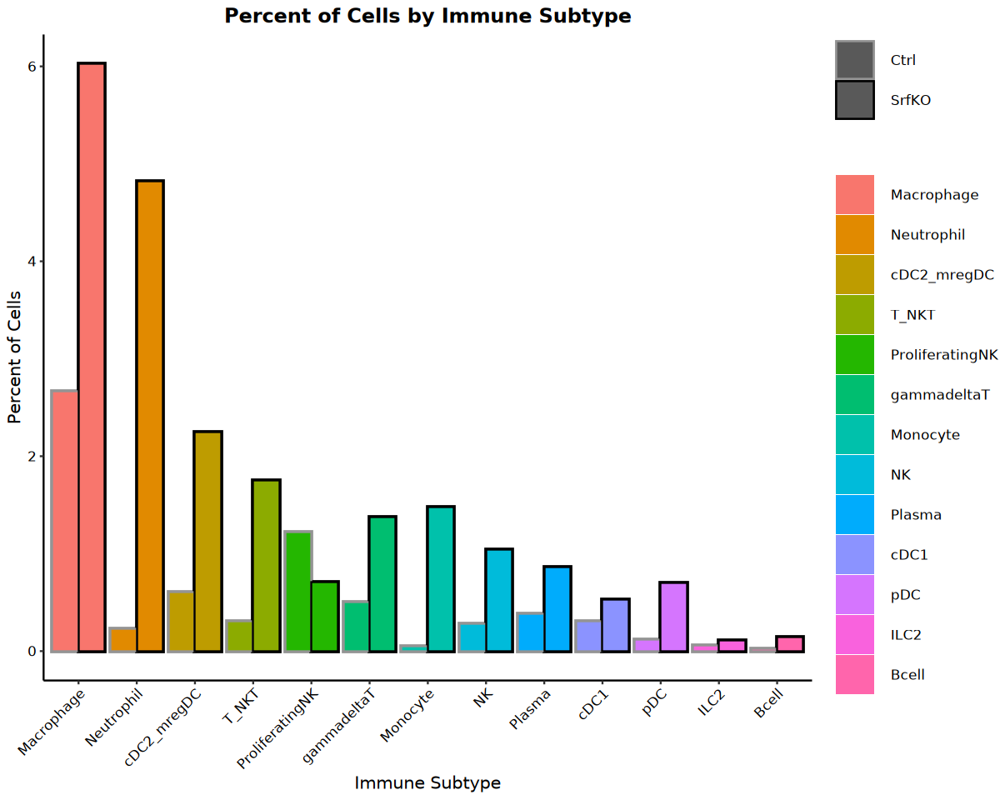

In [154]:
# now match the colors to the seurat object and color outlines by genotype

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype

# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)

# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))

# reorder data_long levels to match seurat object levels
data_long$Immune_subtype <- factor(data_long$Immune_subtype, levels=c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"))

# Define a custom color palette for conditions
condition_palette <- c('Ctrl' = '#949494', 'SrfKO' = '#000000')  # Gray for Ctrl and Black for SrfKO

saved <- options(repr.plot.width = 10, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Immune_subtype, color = Condition)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.9), size = 1) + 
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "right",
    legend.key.width = unit(2, "lines"),   # Increase the width of legend keys
    legend.key.height = unit(2, "lines"),  # Increase the height of legend keys
    legend.spacing.x = unit(0.4, "cm"),      # Increase horizontal spacing between legend items
    legend.spacing.y = unit(0.5, "cm"),       # Increase vertical spacing between legend items
    #aspect.ratio = 1/2
) +
  labs(
    title = "Percent of Cells by Immune Subtype",
    x = "Immune Subtype",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = my_color_palette) +
  scale_color_manual(values = condition_palette) +
  aes(group = Condition) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.9))

options(saved) # restore old settings             


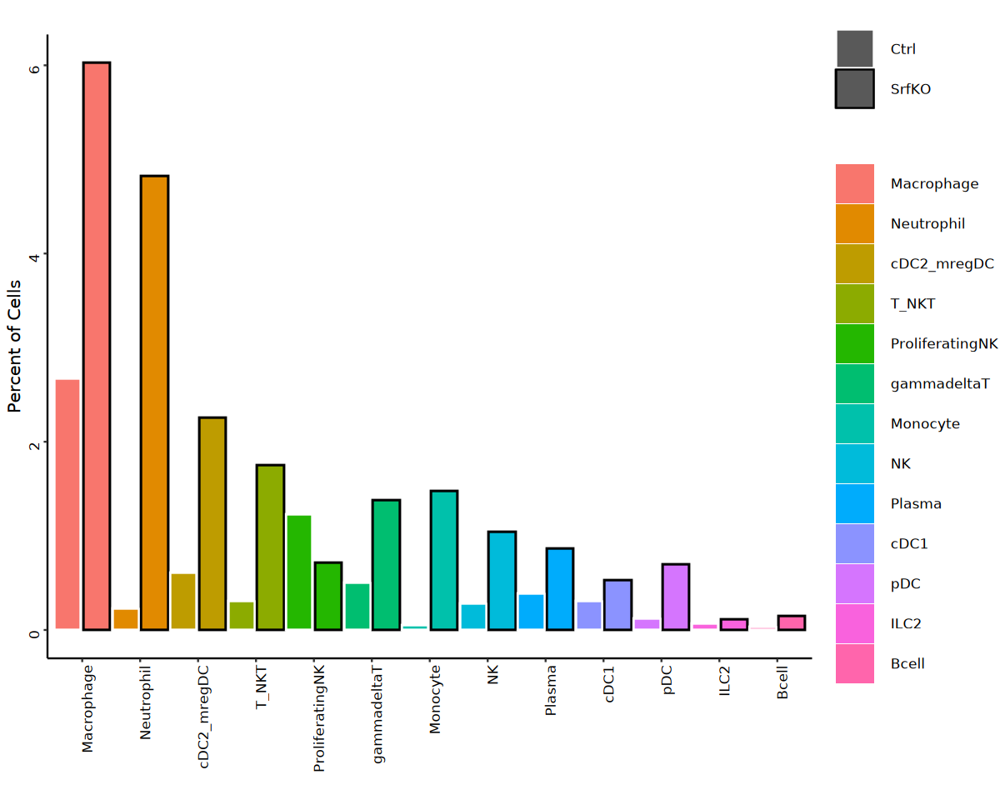

In [162]:
# flip
# now match the colors to the seurat object and color outlines by genotype

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype

# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)

# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))

# reorder data_long levels to match seurat object levels
data_long$Immune_subtype <- factor(data_long$Immune_subtype, levels=c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"))

# Define a custom color palette for conditions
condition_palette <- c('Ctrl' = '#FFFFFF', 'SrfKO' = '#000000')  # White for Ctrl and Black for SrfKO

saved <- options(repr.plot.width = 10, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Immune_subtype, color = Condition)) +
  geom_bar(stat = "identity", position = position_dodge(width = 1), size = 0.8) + 
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 90, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(angle = 90, size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "right",
    legend.key.width = unit(2, "lines"),   # Increase the width of legend keys
    legend.key.height = unit(2, "lines"),  # Increase the height of legend keys
    legend.spacing.x = unit(0.4, "cm"),      # Increase horizontal spacing between legend items
    legend.spacing.y = unit(0.5, "cm"),       # Increase vertical spacing between legend items
    #aspect.ratio = 1/2
) +
  labs(
    title = "",
    x = "",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = my_color_palette) +
  scale_color_manual(values = condition_palette) +
  aes(group = Condition) +
  geom_bar(stat = "identity", position = position_dodge(width = 1))

options(saved) # restore old settings             


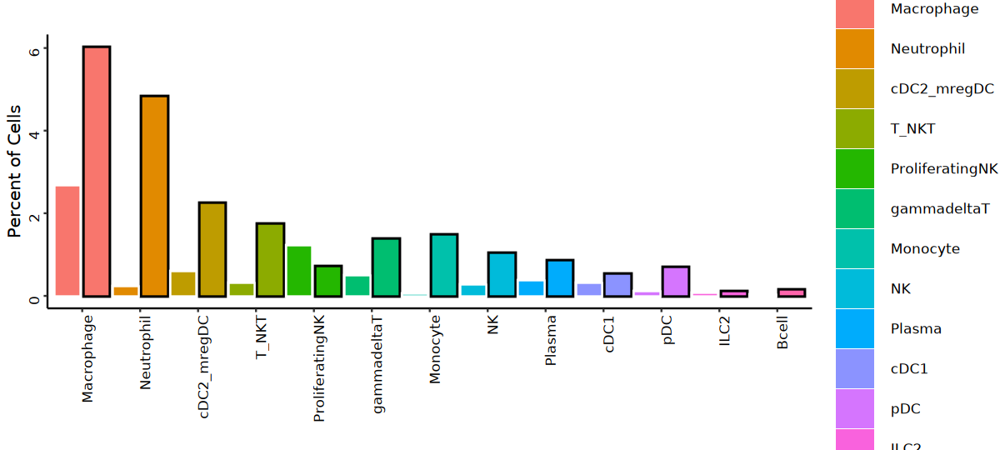

In [173]:
# shorten
# now match the colors to the seurat object and color outlines by genotype

# first some prep work to extract the color pallette from the seurat object
require(scales)
Adult_Srfflox_SrfKO_immune_tmp <- Adult_Srfflox_SrfKO_immune
Idents(Adult_Srfflox_SrfKO_immune_tmp) <- Adult_Srfflox_SrfKO_immune_tmp$ImmuneSubtype

# Create vector with levels of object@ident
identities <- levels(Adult_Srfflox_SrfKO_immune_tmp)

# Create vector of default ggplot2 colors
my_color_palette <- hue_pal()(length(identities))

# reorder data_long levels to match seurat object levels
data_long$Immune_subtype <- factor(data_long$Immune_subtype, levels=c("Macrophage", "Neutrophil", "cDC2_mregDC", "T_NKT", "ProliferatingNK", "gammadeltaT", "Monocyte", "NK", "Plasma", "cDC1", "pDC", "ILC2", "Bcell"))

# Define a custom color palette for conditions
condition_palette <- c('Ctrl' = '#FFFFFF', 'SrfKO' = '#000000')  # White for Ctrl and Black for SrfKO

saved <- options(repr.plot.width = 10, repr.plot.height = 4.5) # Make the plots bigger from here on out, save old options

ggplot(data_long, aes(x = Immune_subtype, y = Percent, fill = Immune_subtype, color = Condition)) +
  geom_bar(stat = "identity", position = position_dodge(width = 1), size = 0.8) + 
  theme_classic() +  # Use a classic theme as a base
  theme(
    axis.text.x = element_text(angle = 90, hjust = 1, size = 10, color = "black"),
    axis.text.y = element_text(angle = 90, size = 10, color = "black"),
    axis.title = element_text(size = 12),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 10),
    legend.position = "right",
    legend.key.width = unit(2, "lines"),   # Increase the width of legend keys
    legend.key.height = unit(2, "lines"),  # Increase the height of legend keys
    legend.spacing.x = unit(0.4, "cm"),      # Increase horizontal spacing between legend items
    legend.spacing.y = unit(0.5, "cm"),       # Increase vertical spacing between legend items
    #aspect.ratio = 1/2
) +
  labs(
    title = "",
    x = "",
    y = "Percent of Cells"
  ) +
  scale_fill_manual(values = my_color_palette) +
  scale_color_manual(values = condition_palette) +
  aes(group = Condition) +
  geom_bar(stat = "identity", position = position_dodge(width = 1))

options(saved) # restore old settings             


In [21]:
head(Adult_Srfflox_SrfKO_immune_tmp)
tail(Adult_Srfflox_SrfKO_immune_tmp)

,orig.ident,nCount_RNA,nFeature_RNA,Sample,genotype,batch,percent.mt,percent.rp,percent.hg,S.Score,G2M.Score,Phase,old.ident,CC.Difference,seurat_clusters,broad_clusters,SR_broad_ImmGen,SR_fine_ImmGen,ImmuneSubtype
,<chr>,<dbl>,<int>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<fct>,<chr>,<chr>,<fct>
Ctrl1___AAACCCAAGGTCCCGT-1,Ctrl1,5652,2163,Ctrl1,Ctrl,1,2.813163,11.341118,0,-0.087413046,-0.16113772,G1,Ctrl1,0.073724669,0,5,Macrophages,Macrophages (MF.11C-11B+),Macrophage
Ctrl1___AAACCCACATCACCAA-1,Ctrl1,6085,2336,Ctrl1,Ctrl,1,2.678718,10.566968,0,-0.070066492,-0.04961594,G1,Ctrl1,-0.020450549,6,15,ILC,Tgd (Tgd.mat.VG2+),gammadeltaT
Ctrl1___AAACCCACATGTCAGT-1,Ctrl1,15094,4189,Ctrl1,Ctrl,1,3.186697,23.227773,0,0.795792256,0.30071105,S,Ctrl1,0.495081210,5,10,NK cells,NK cells (NK.DAP10-),ProliferatingNK
Ctrl1___AAACGCTGTTAGGGAC-1,Ctrl1,5265,2227,Ctrl1,Ctrl,1,5.963913,10.465337,0,0.002507597,0.77092168,G2M,Ctrl1,-0.768414085,10,13,DC,DC (DC.103-11B+24+),cDC1
Ctrl1___AAAGAACGTTCCCACT-1,Ctrl1,15788,4236,Ctrl1,Ctrl,1,4.826450,20.502914,0,0.536669815,0.31097436,S,Ctrl1,0.225695459,5,10,ILC,NK cells (NK.H+MCMV1),ProliferatingNK
Ctrl1___AAAGGTACACCCGTAG-1,Ctrl1,2131,1272,Ctrl1,Ctrl,1,4.411075,9.150634,0,-0.065255999,-0.06062017,G1,Ctrl1,-0.004635824,0,5,Macrophages,Macrophages (MF.11C-11B+),Macrophage
Ctrl1___AAAGGTACAGAATCGG-1,Ctrl1,5258,2080,Ctrl1,Ctrl,1,4.849753,18.181818,0,0.006645728,-0.03464015,S,Ctrl1,0.041285883,6,15,NKT,Tgd (Tgd.mat.VG2+),gammadeltaT
Ctrl1___AAATGGACAGCTTCGG-1,Ctrl1,3968,1885,Ctrl1,Ctrl,1,5.771169,16.582661,0,0.628106036,0.23055130,S,Ctrl1,0.397554733,5,10,NKT,T cells (T.8EFF.OT1.D5.VSVOVA),ProliferatingNK
Ctrl1___AACAAAGCAAGAGATT-1,Ctrl1,5992,2169,Ctrl1,Ctrl,1,3.120828,16.405207,0,-0.054819336,-0.11492390,G1,Ctrl1,0.060104561,0,5,Macrophages,Macrophages (MF.103-11B+24-),Macrophage


,orig.ident,nCount_RNA,nFeature_RNA,Sample,genotype,batch,percent.mt,percent.rp,percent.hg,S.Score,G2M.Score,Phase,old.ident,CC.Difference,seurat_clusters,broad_clusters,SR_broad_ImmGen,SR_fine_ImmGen,ImmuneSubtype
,<chr>,<dbl>,<int>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<fct>,<chr>,<chr>,<fct>
SrfKO2___TTTCACACAGCTTTCC-1,SrfKO2,15663,3876,SrfKO2,SrfKO,2,3.371002,11.74743,0,-0.08028413,-0.09196169,G1,SrfKO2,0.01167756,7,5,Monocytes,Monocytes (MO.6+2+),Monocyte
SrfKO2___TTTCAGTTCTGGGCCA-1,SrfKO2,10817,3034,SrfKO2,SrfKO,2,3.420542,19.10881,0,-0.00516175,-0.08284147,G1,SrfKO2,0.07767972,3,10,ILC,ILC (LPL.NCR+CNK),T_NKT
SrfKO2___TTTGATCGTACTCGCG-1,SrfKO2,3538,1801,SrfKO2,SrfKO,2,4.861504,12.06897,0,-0.05042139,-0.06800323,G1,SrfKO2,0.01758184,7,5,Macrophages,Macrophages (MF.103-11B+24-),Monocyte
SrfKO2___TTTGATCTCGGTAGGA-1,SrfKO2,4182,1760,SrfKO2,SrfKO,2,4.591105,22.40555,0,-0.05323729,-0.07523721,G1,SrfKO2,0.02199992,14,16,B cells,B cells (B.Fo),Bcell
SrfKO2___TTTGGAGCACAGCTGC-1,SrfKO2,2710,1279,SrfKO2,SrfKO,2,4.464945,5.97786,0,-0.01430311,-0.06945358,G1,SrfKO2,0.05515047,0,5,Macrophages,Monocytes (MO.6+2+),Macrophage
SrfKO2___TTTGGTTAGAGGTCGT-1,SrfKO2,27142,4878,SrfKO2,SrfKO,2,4.122762,31.25414,0,0.63923879,0.28964574,S,SrfKO2,0.34959305,5,10,ILC,NK cells (NK.H+.MCMV1),ProliferatingNK
SrfKO2___TTTGGTTCAGTTAGGG-1,SrfKO2,8700,2827,SrfKO2,SrfKO,2,4.551724,18.32184,0,-0.06337425,-0.03763121,G1,SrfKO2,-0.02574304,8,10,ILC,ILC (LPL.NCR+CNK),NK
SrfKO2___TTTGTTGAGATTACCC-1,SrfKO2,24266,3586,SrfKO2,SrfKO,2,3.428666,18.12825,0,-0.06841007,-0.10778004,G1,SrfKO2,0.03936997,2,13,DC,DC (DC),cDC2_mregDC
SrfKO2___TTTGTTGAGTAGAATC-1,SrfKO2,16165,4231,SrfKO2,SrfKO,2,2.907516,10.27529,0,-0.10329888,-0.17942709,G1,SrfKO2,0.07612821,0,5,Macrophages,Macrophages (MFIO5.II-480INT),Macrophage


In [174]:
#Subset SrfKO only and Ctrl only
SrfKO_immune_tmp <- subset(Adult_Srfflox_SrfKO_immune_tmp, genotype == "SrfKO")

Ctrl_immune_tmp <- subset(Adult_Srfflox_SrfKO_immune_tmp, genotype == "Ctrl")

SrfKO_immune_tmp
Ctrl_immune_tmp


An object of class Seurat 
26486 features across 3467 samples within 1 assay 
Active assay: RNA (26486 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 3 dimensional reductions calculated: pca, integrated.rpca, umap

An object of class Seurat 
26486 features across 1188 samples within 1 assay 
Active assay: RNA (26486 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 3 dimensional reductions calculated: pca, integrated.rpca, umap

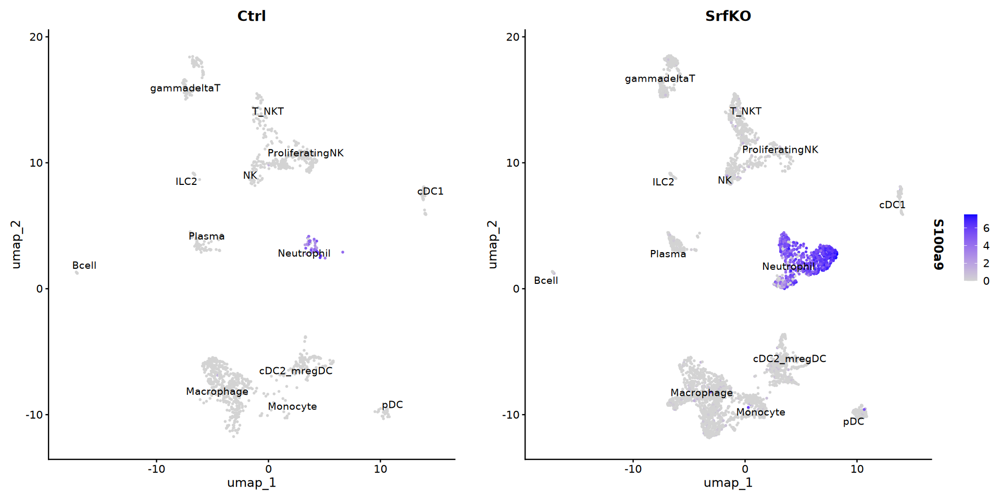

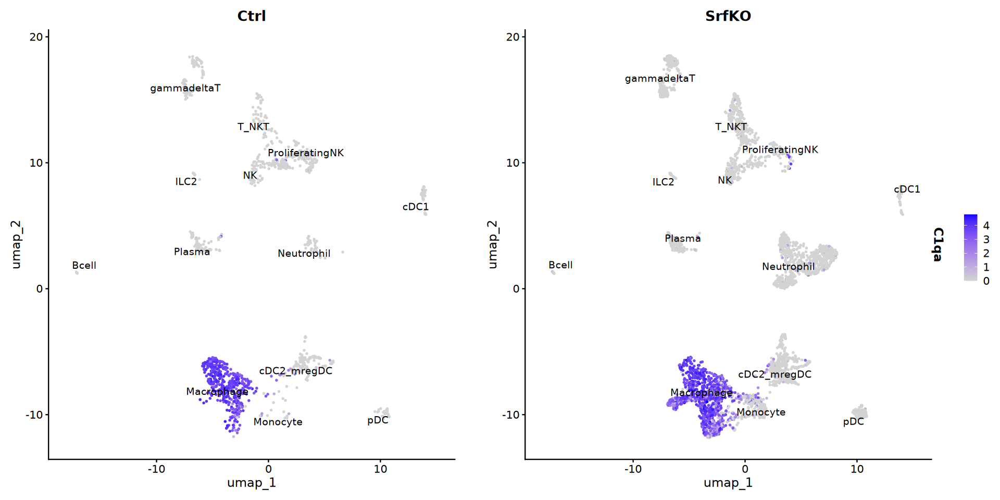

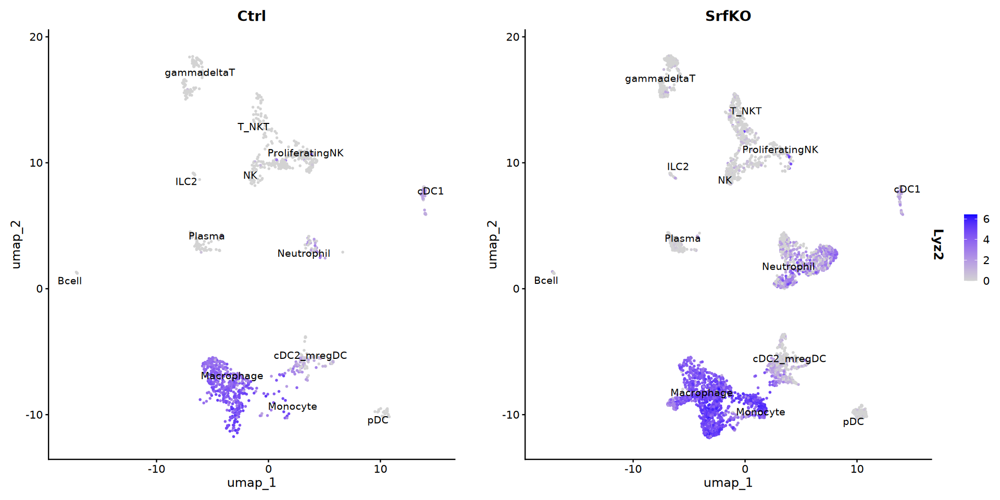

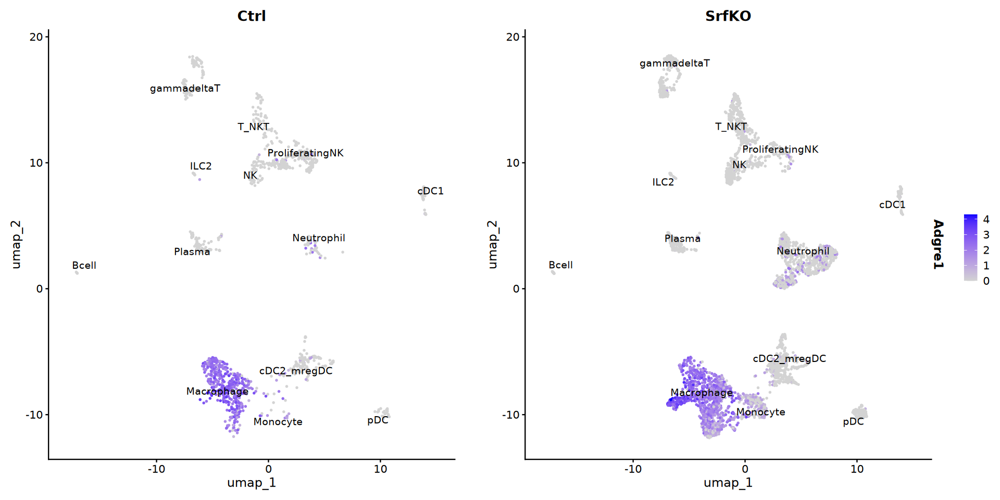

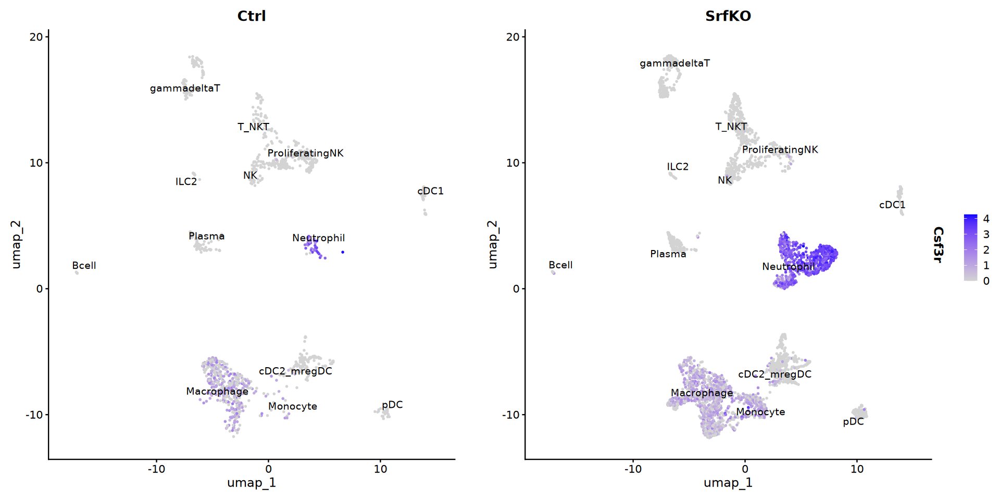

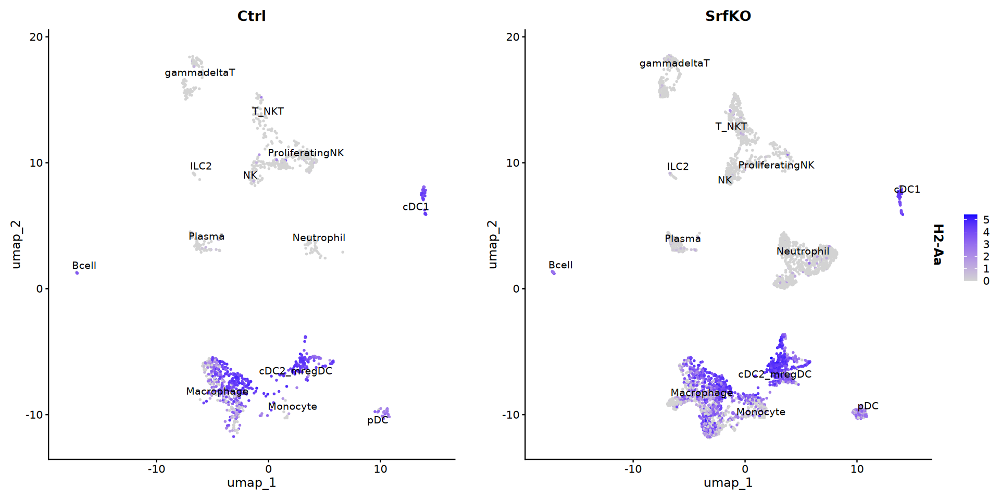

In [180]:
#plot immune markers

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('S100a9'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('C1qa'), 
            pt.size=0.5,
            label=TRUE, 
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Lyz2'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Adgre1'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Csf3r'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('H2-Aa'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype",
            ) + theme(legend.position = "right")

options(saved) # restore old settings


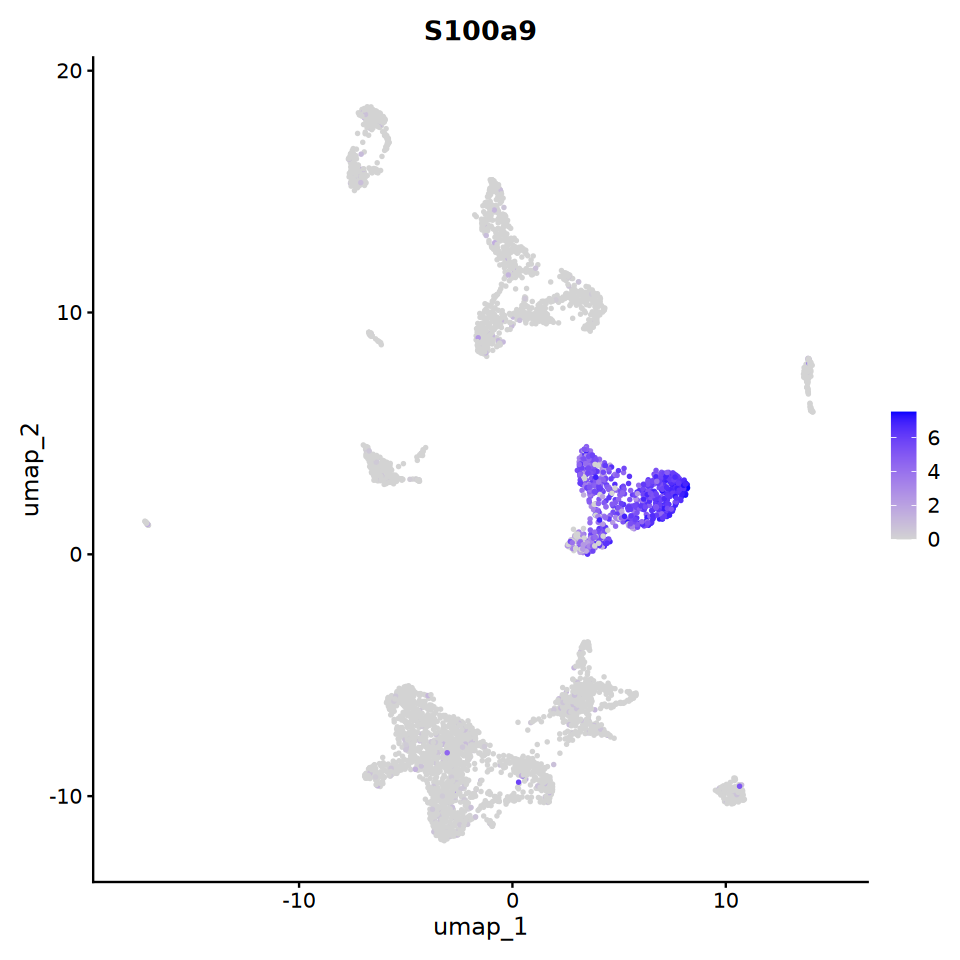

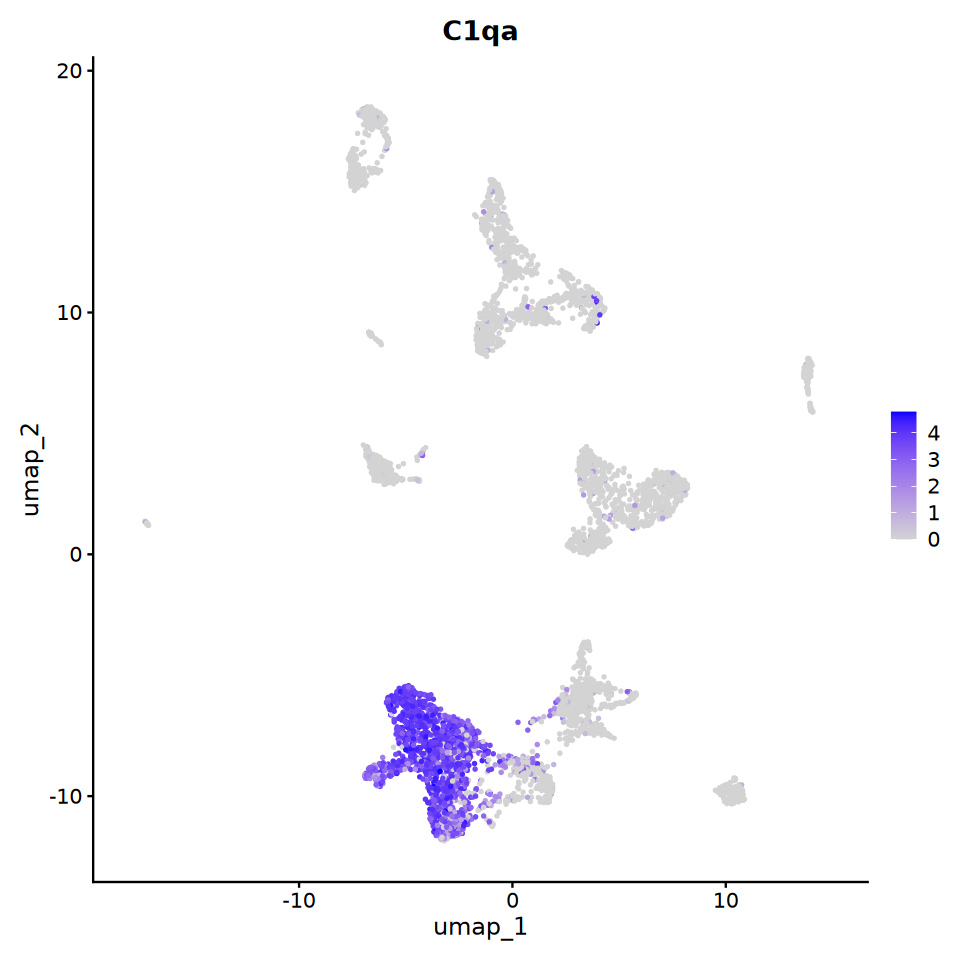

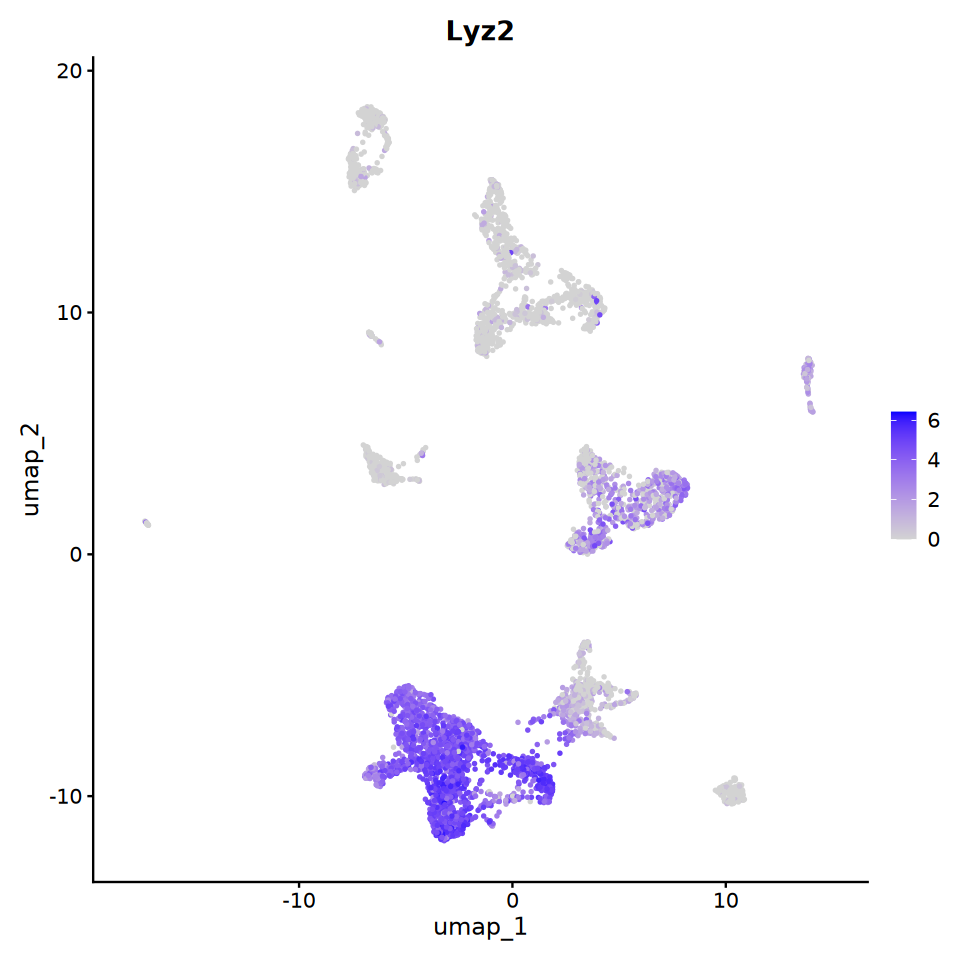

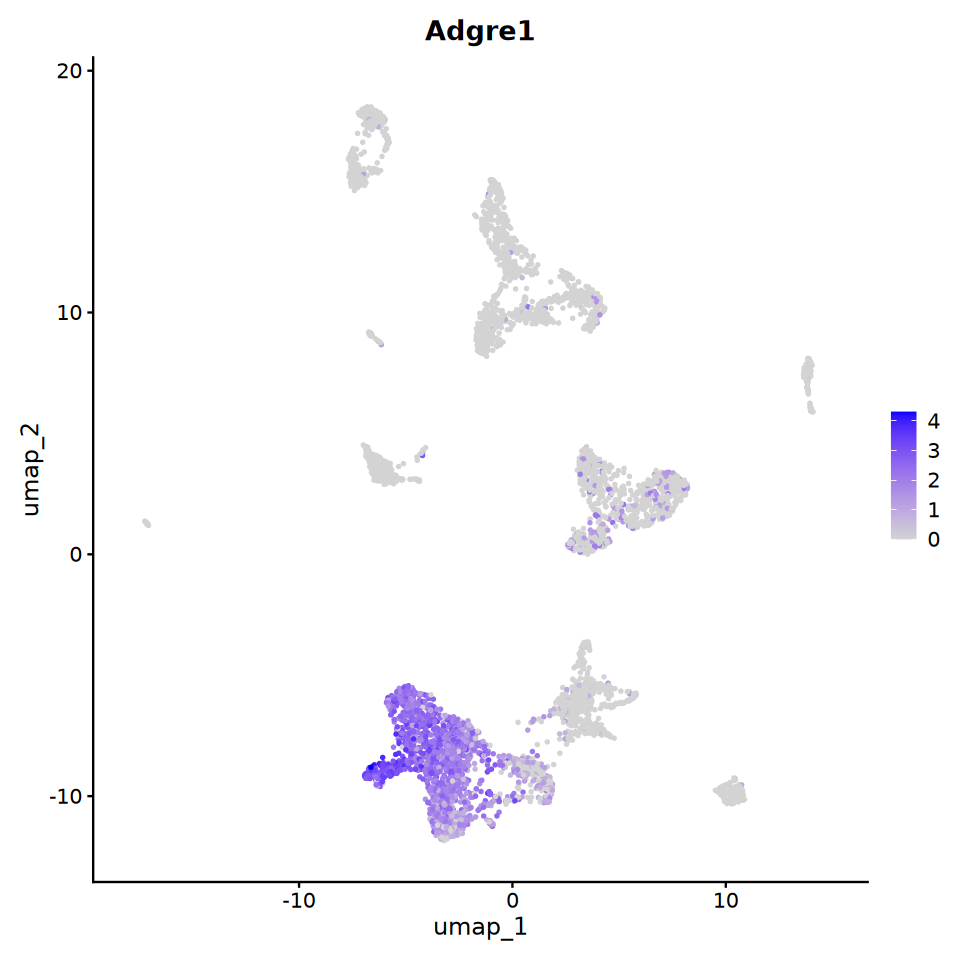

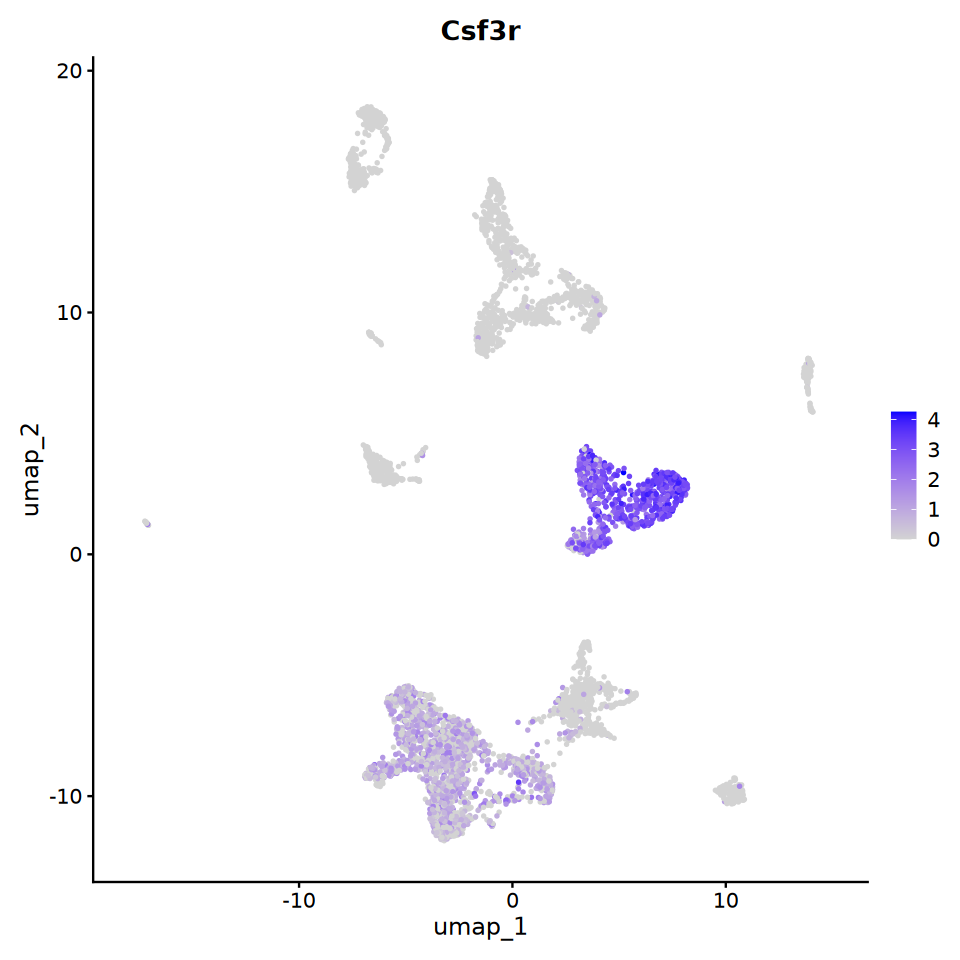

...

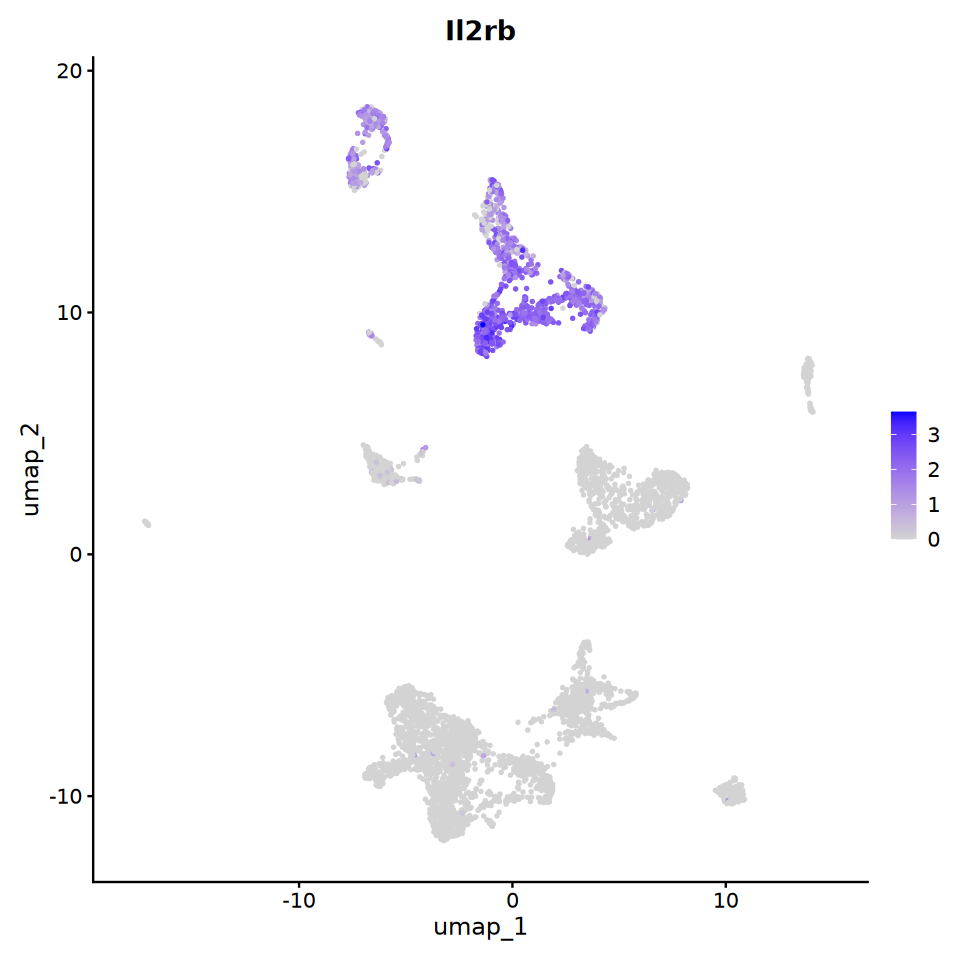

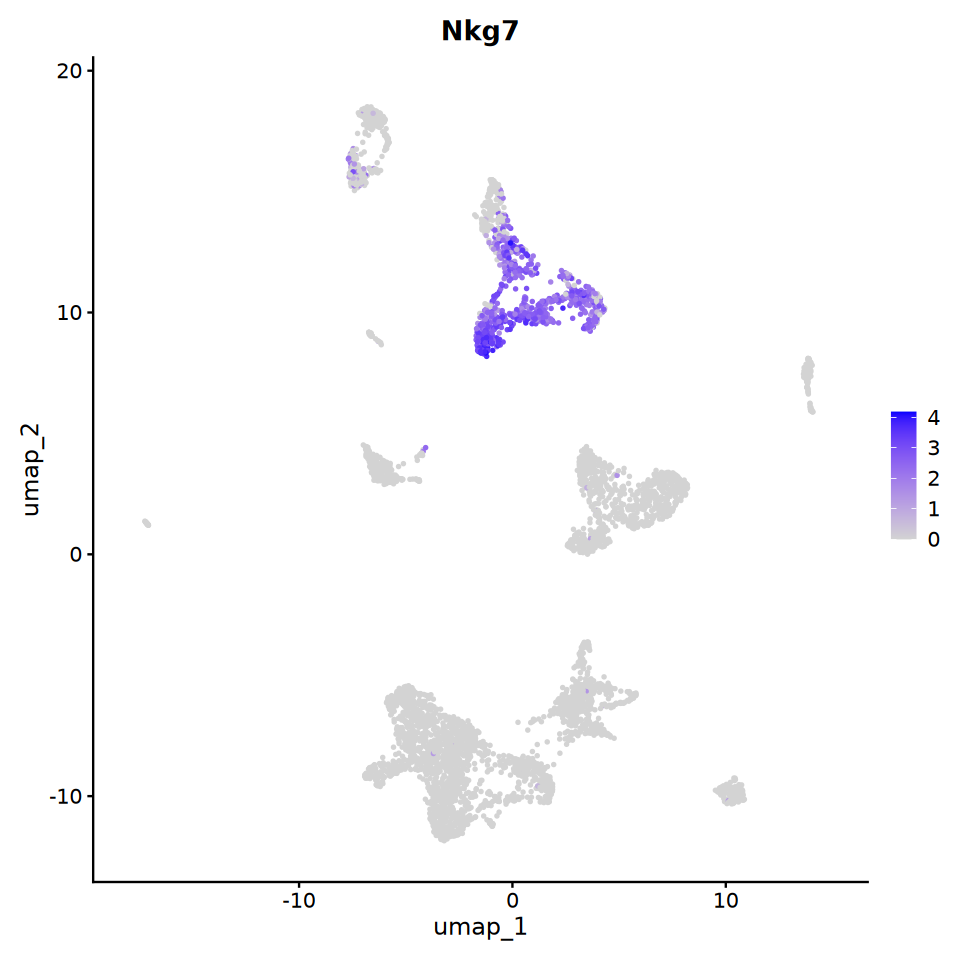

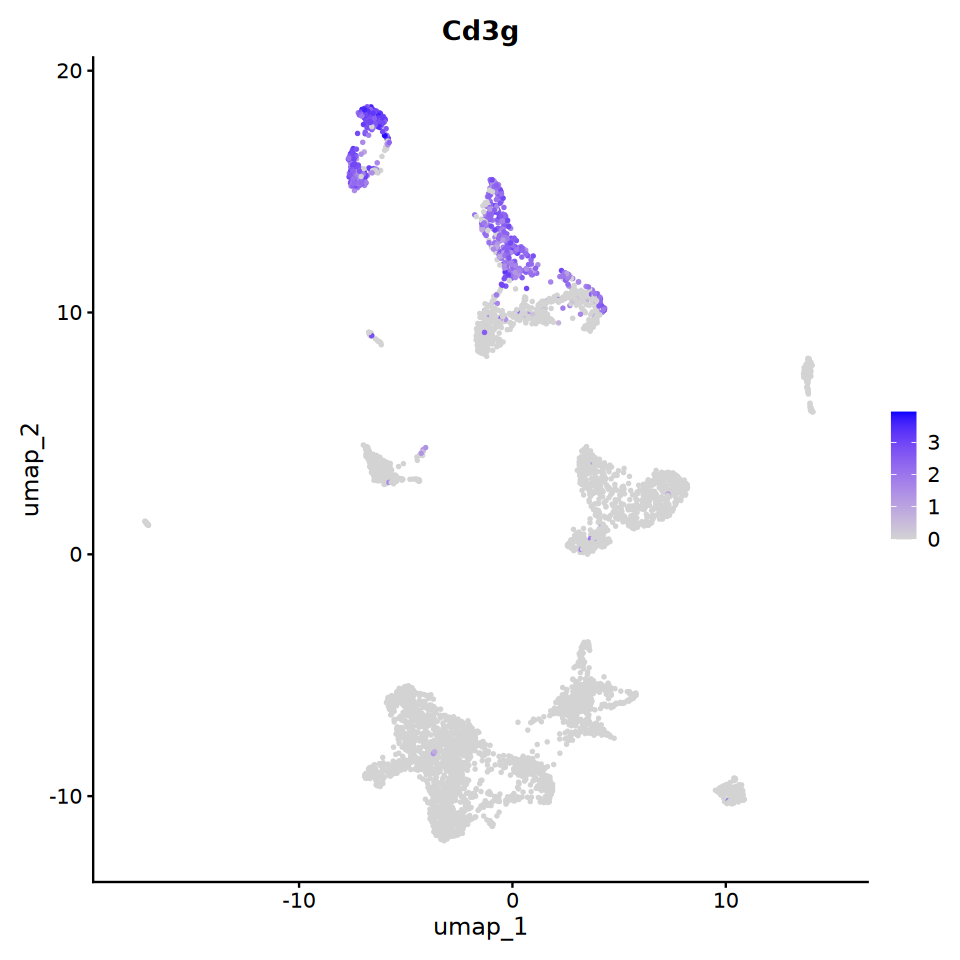

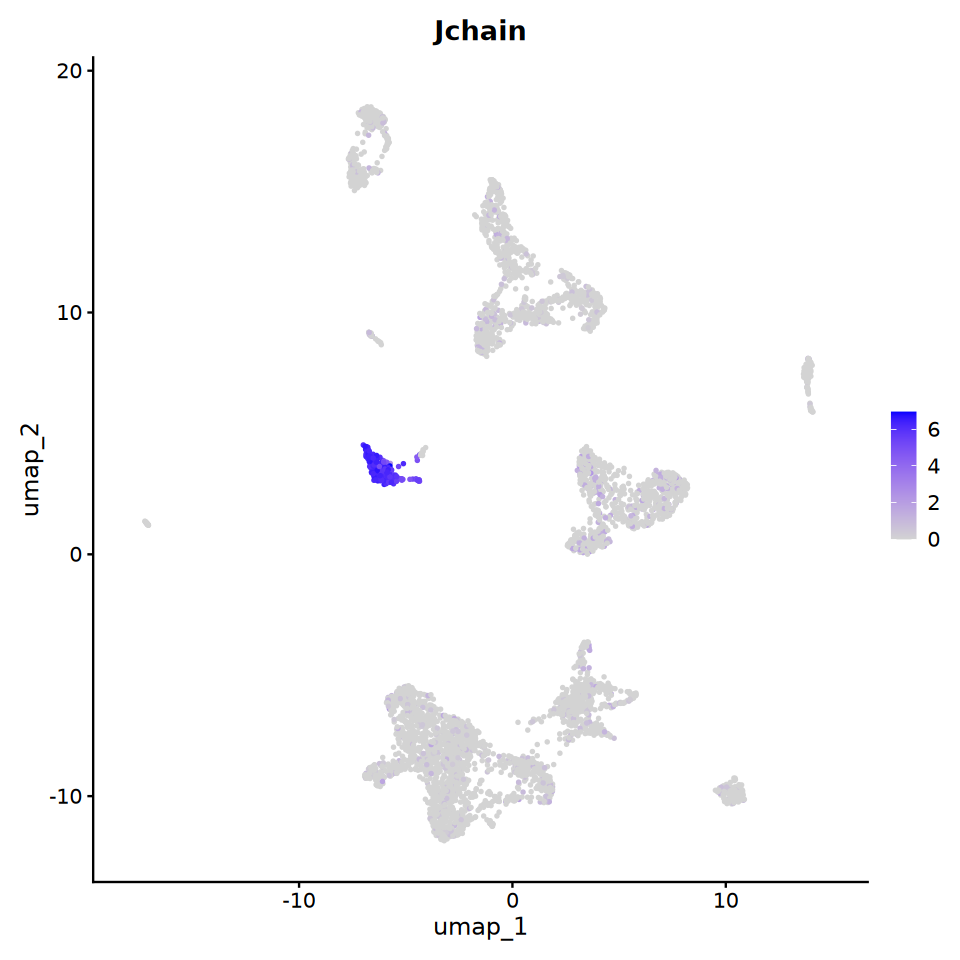

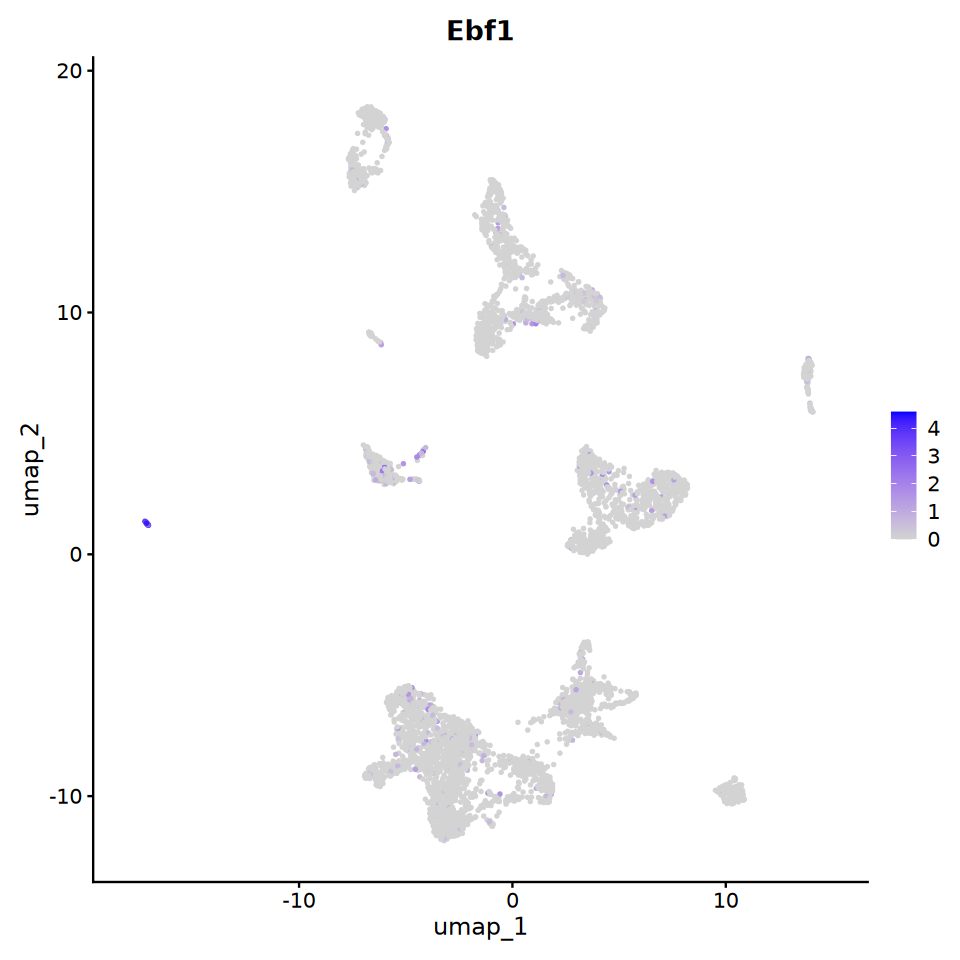

In [183]:
#plot immune markers

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('S100a9'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('C1qa'), 
            pt.size=0.5,
            label=FALSE)
            
FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Lyz2'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Adgre1'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Csf3r'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Clec9a'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Il2rb'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Nkg7'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd3g'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Jchain'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ebf1'), 
            pt.size=0.5,
            label=FALSE)

options(saved) # restore old settings


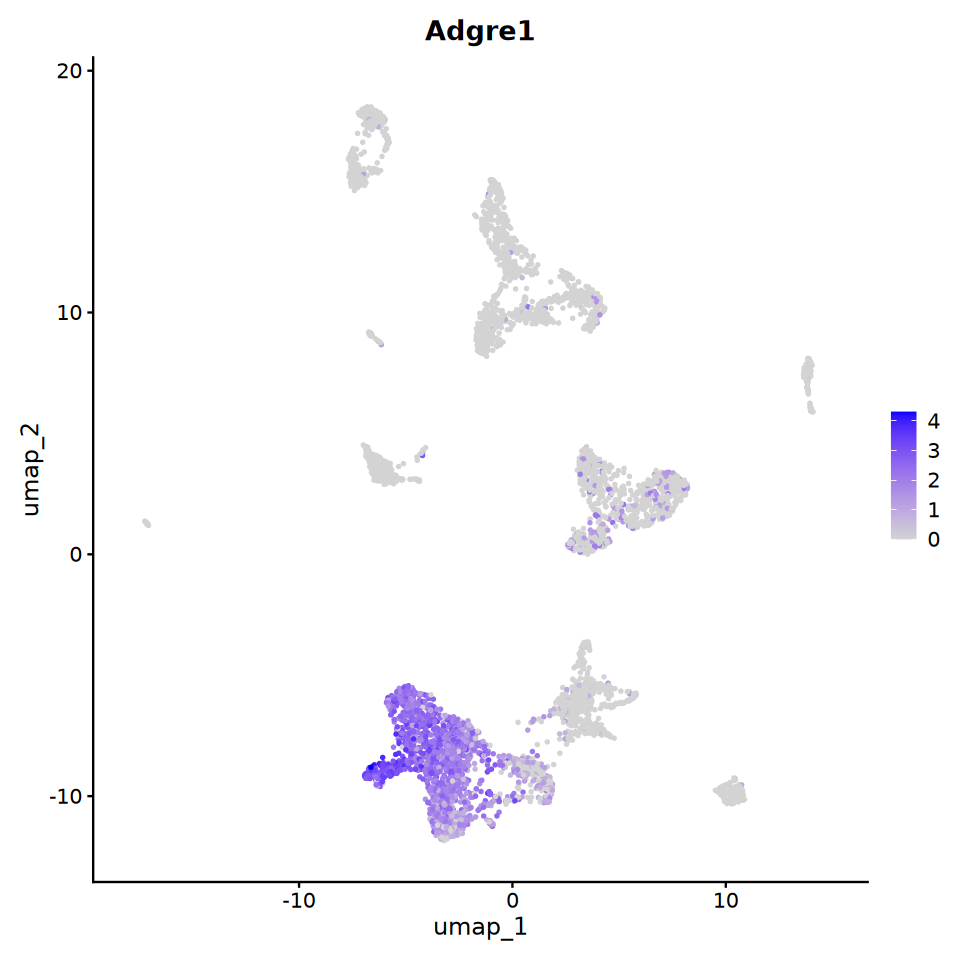

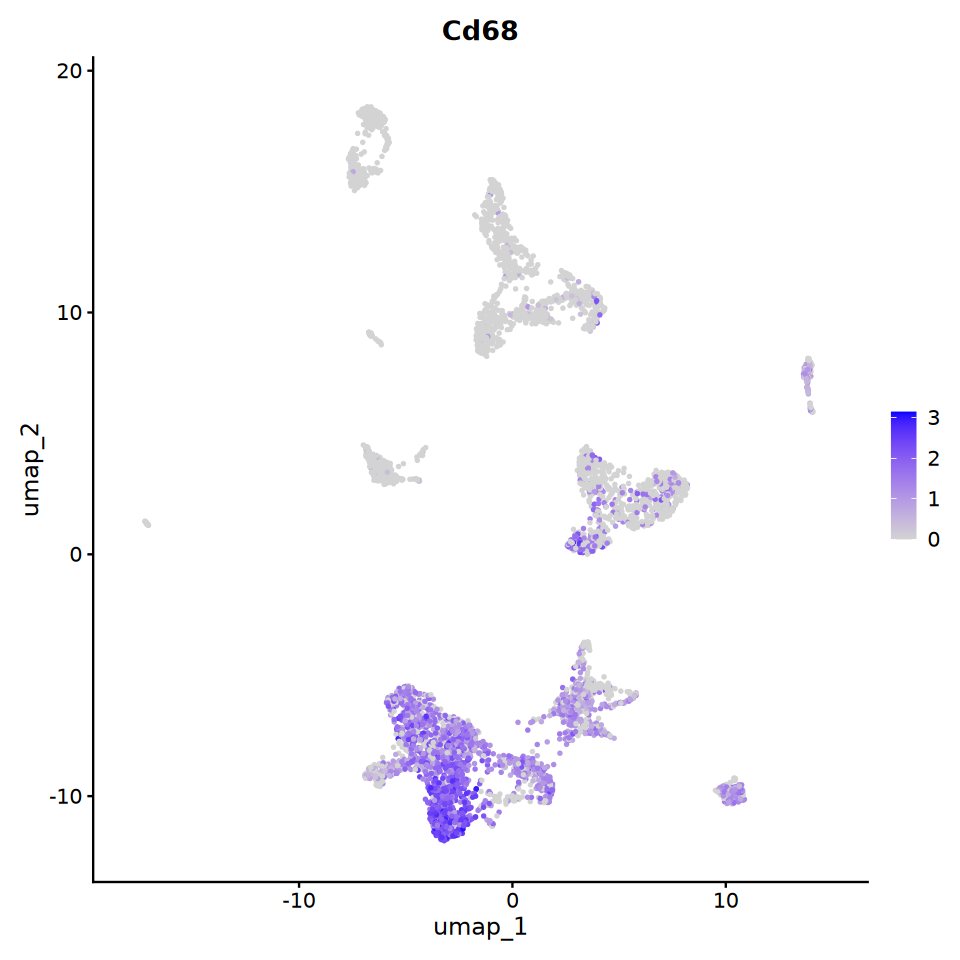

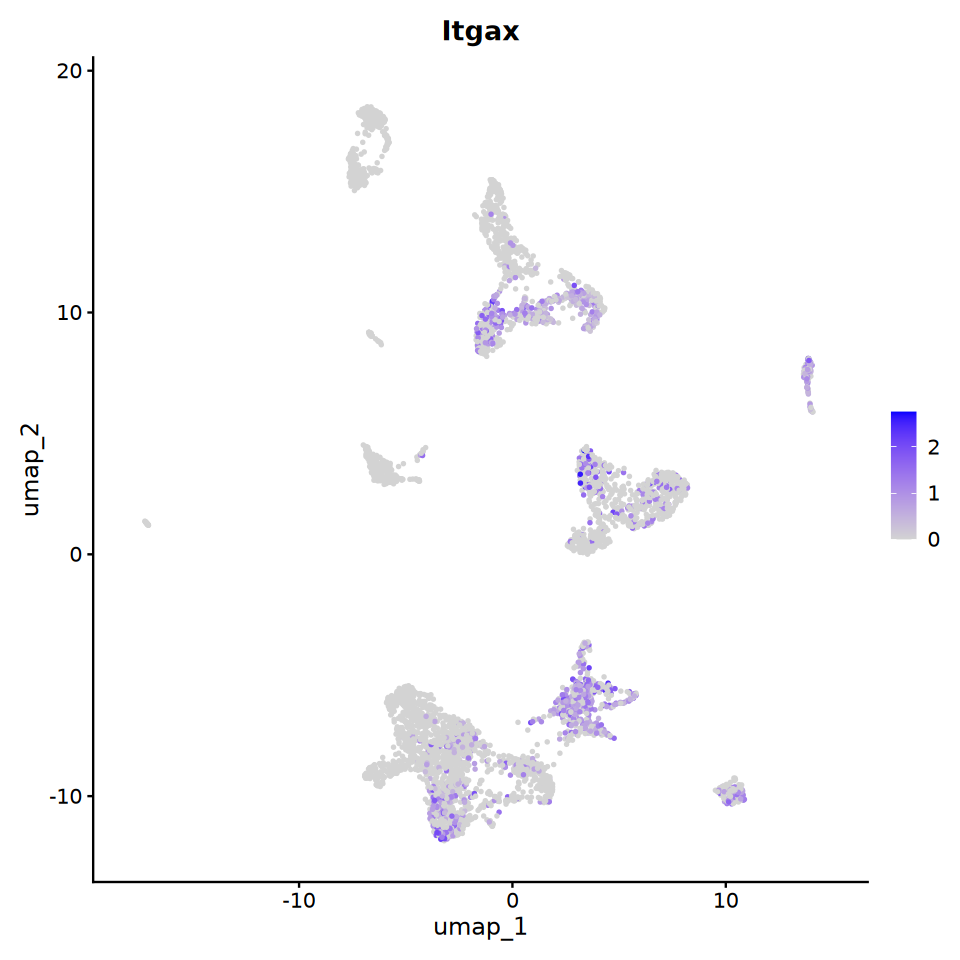

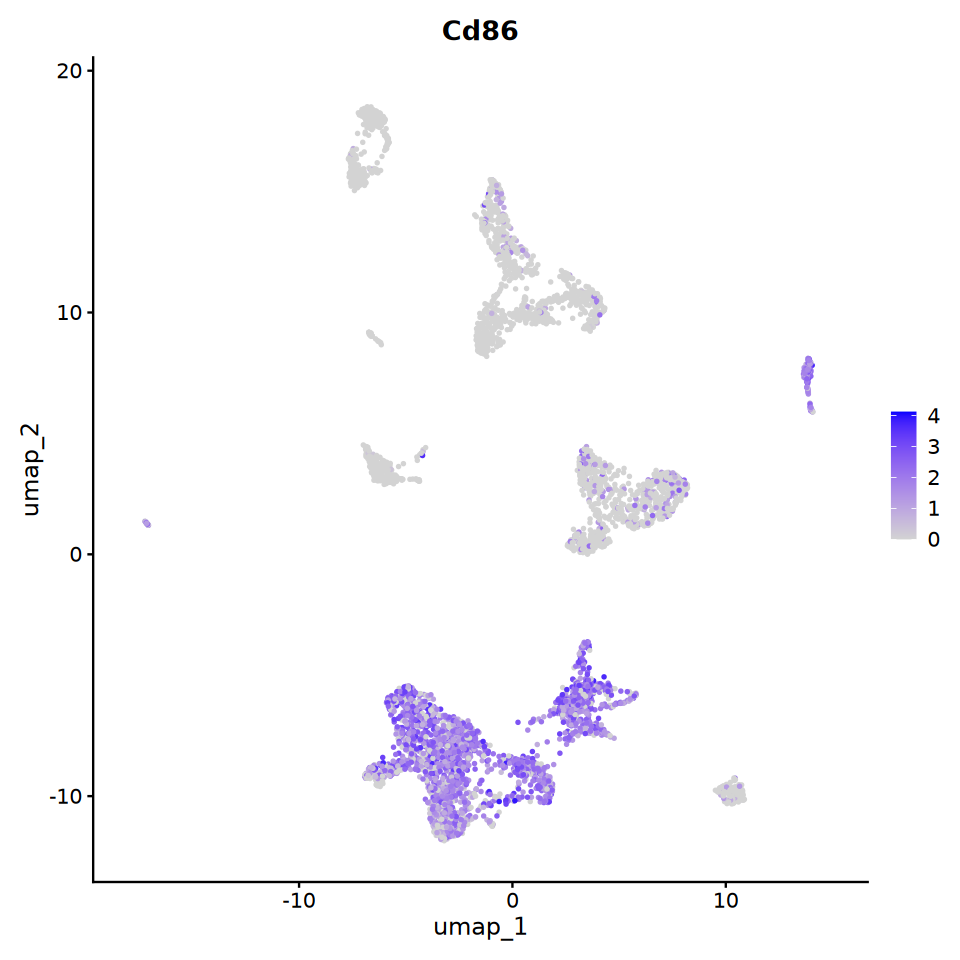

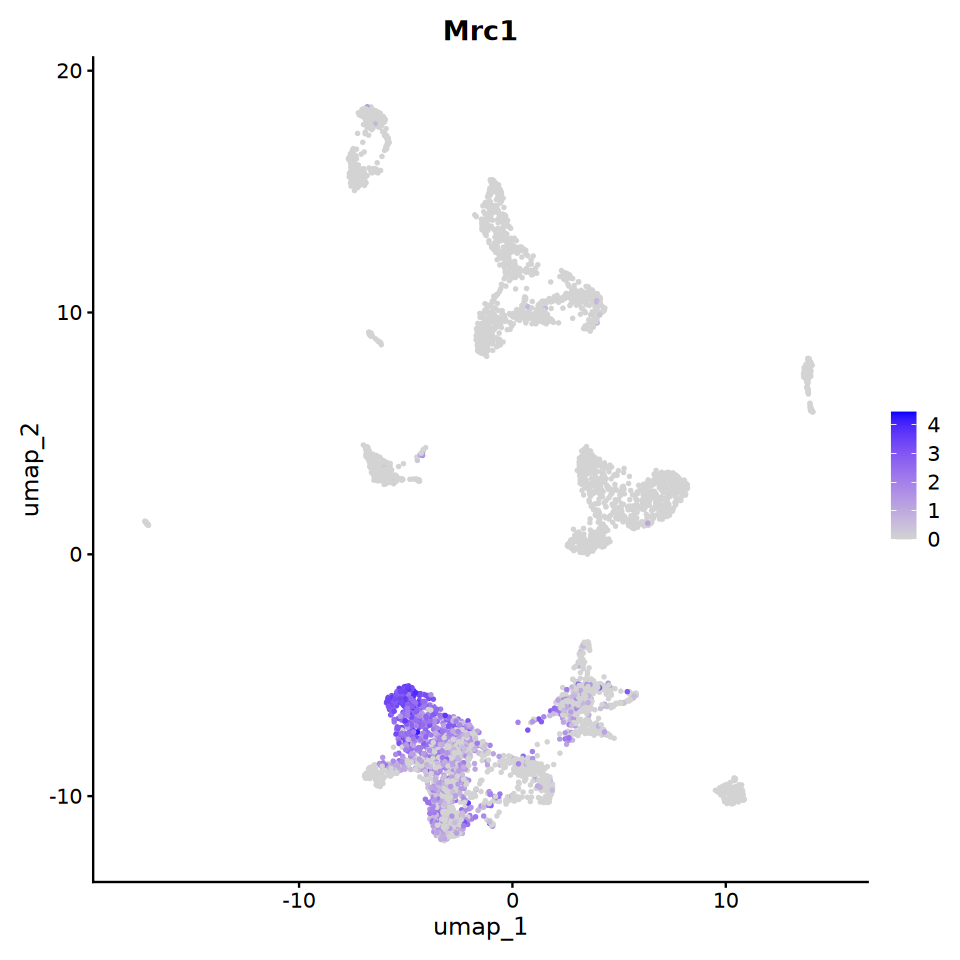

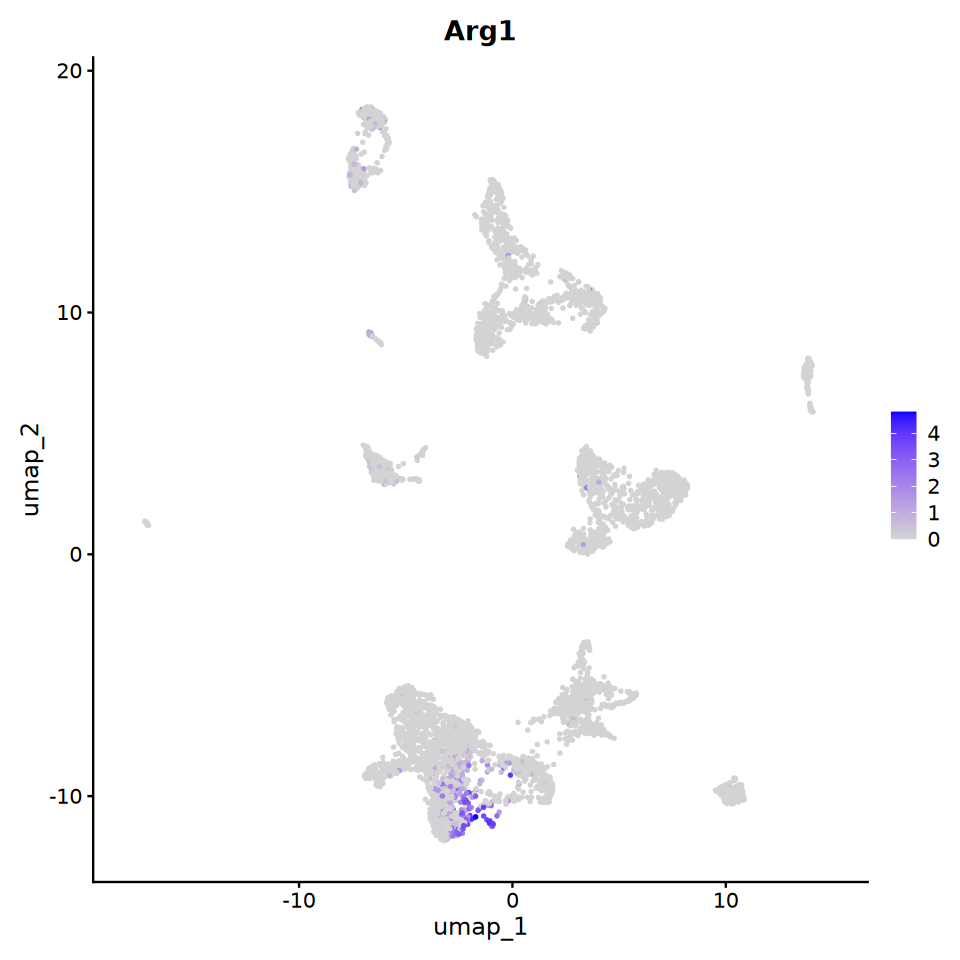

In [184]:
#plot macrophage markers (see https://www.cellsignal.com/products/primary-antibodies/mouse-reactive-m1-vs-m2-macrophage-ihc-antibody-sampler-kit/97624)

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 8, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

# General

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Adgre1'), 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd68'), 
            pt.size=0.5,
            label=FALSE)

#M1

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Itgax'), #Cd11c
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd86'), 
            pt.size=0.5,
            label=FALSE)

#M2

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Mrc1'), #Cd206 
            pt.size=0.5,
            label=FALSE)

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Arg1'), 
            pt.size=0.5,
            label=FALSE)


options(saved) # restore old settings


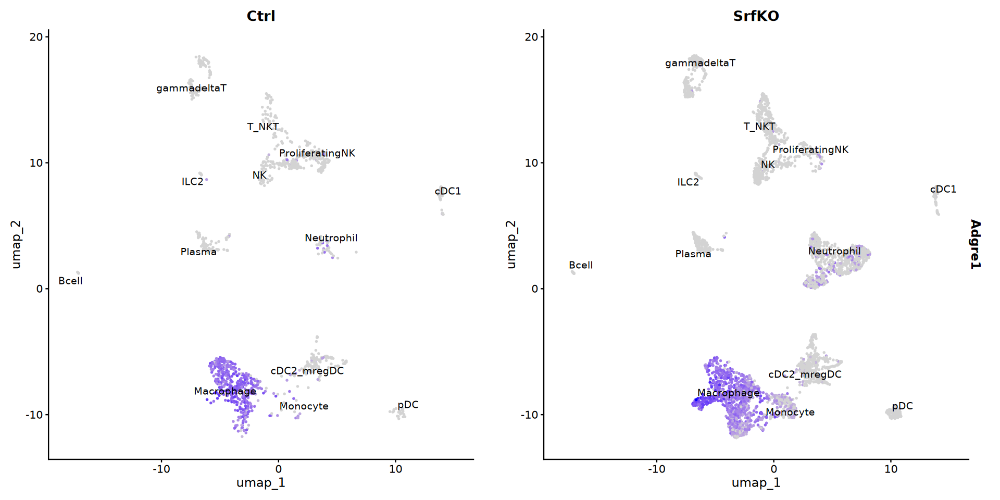

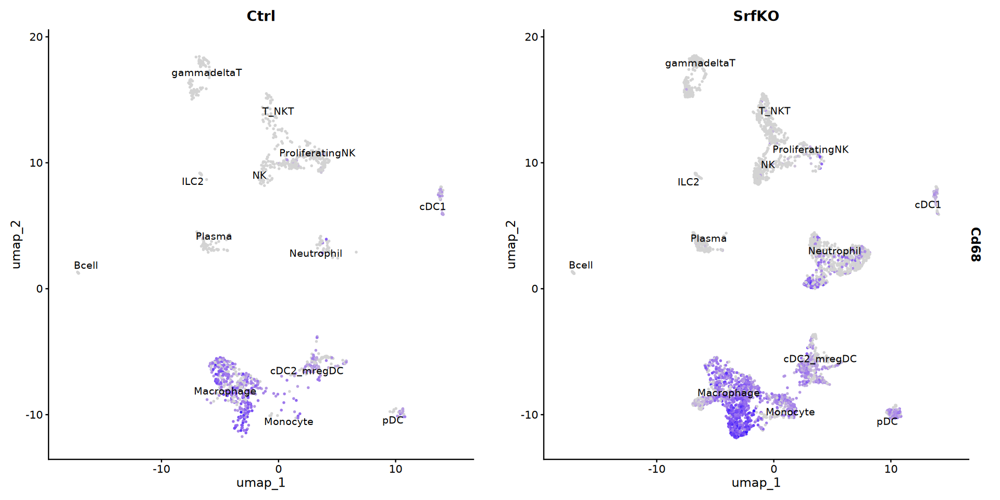

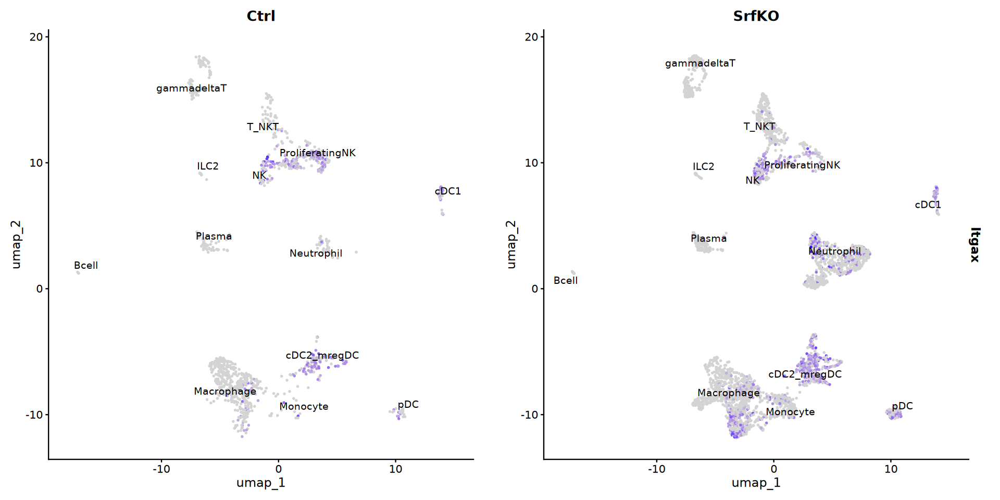

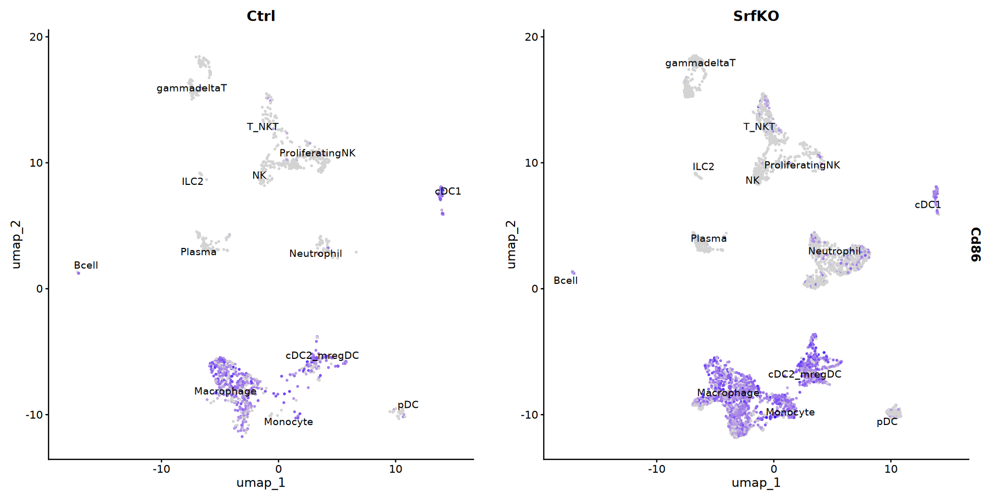

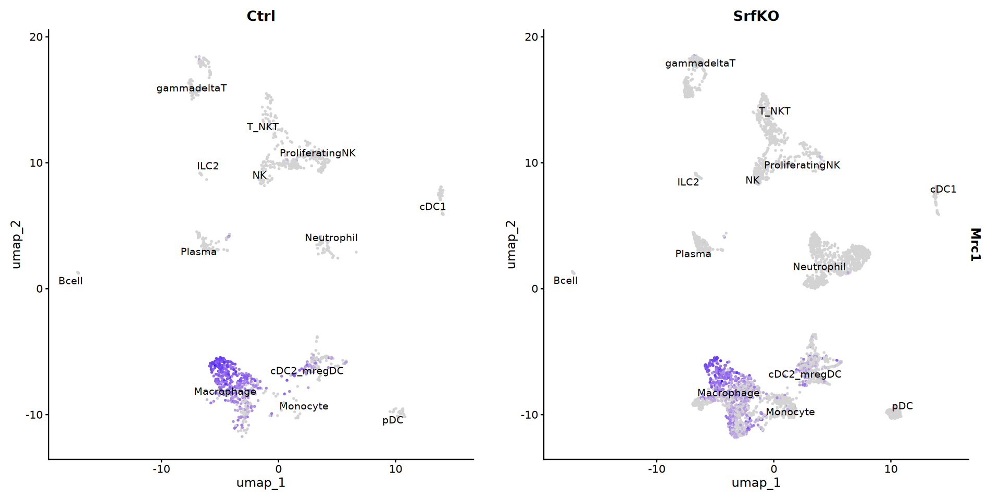

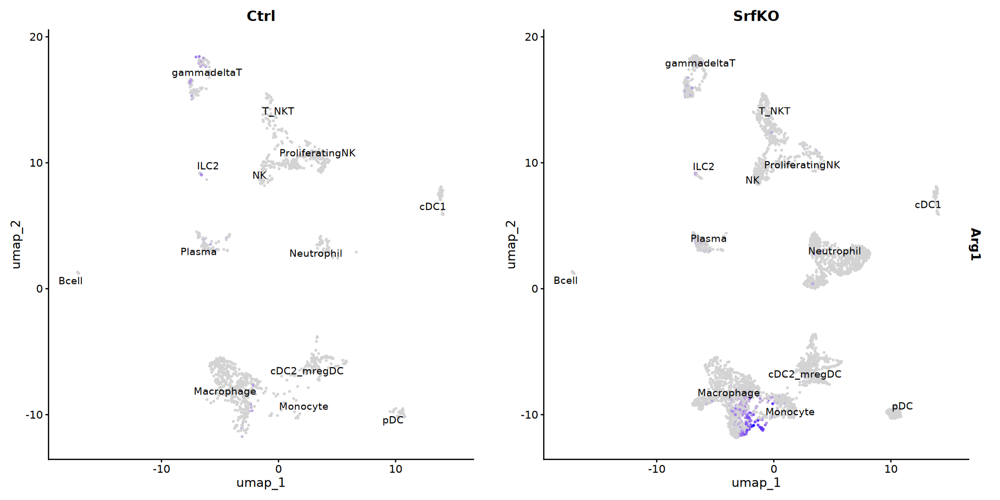

In [185]:
# plot macrophage markers (see https://www.cellsignal.com/products/primary-antibodies/mouse-reactive-m1-vs-m2-macrophage-ihc-antibody-sampler-kit/97624)
# split by genotype and label

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

# General

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Adgre1'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd68'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")
#M1

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Itgax'), #Cd11c
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd86'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

#M2

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Mrc1'), #Cd206 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Arg1'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")


options(saved) # restore old settings


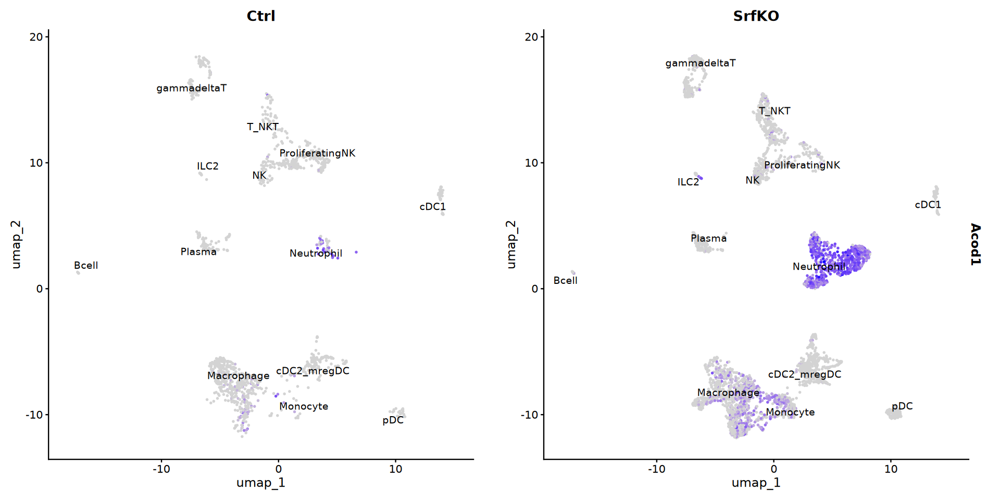

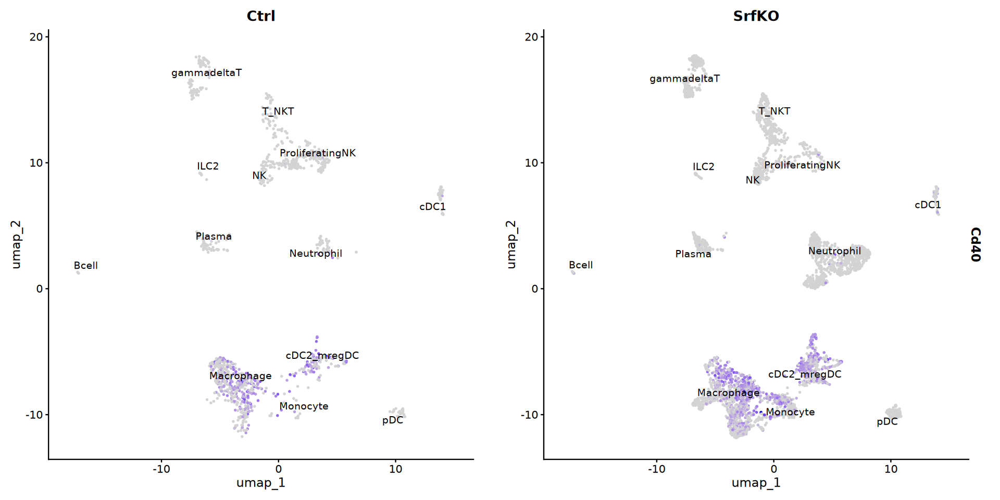

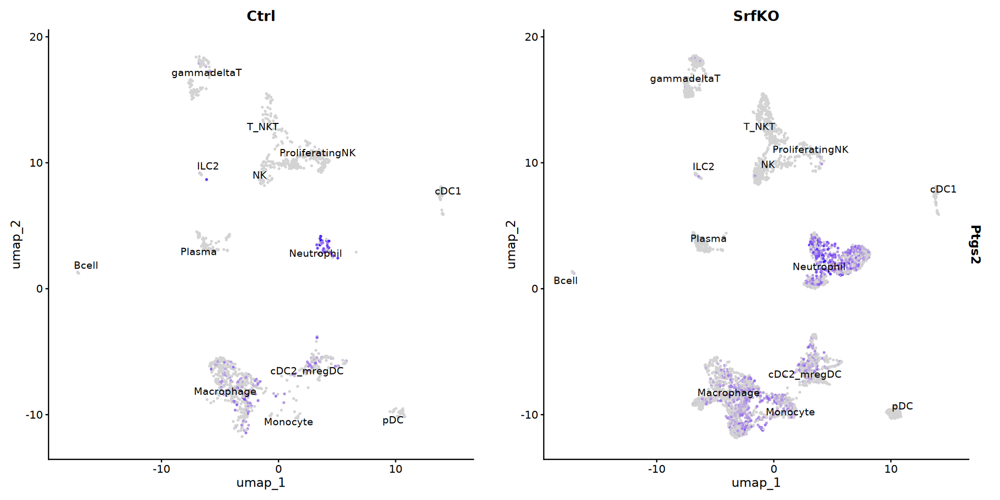

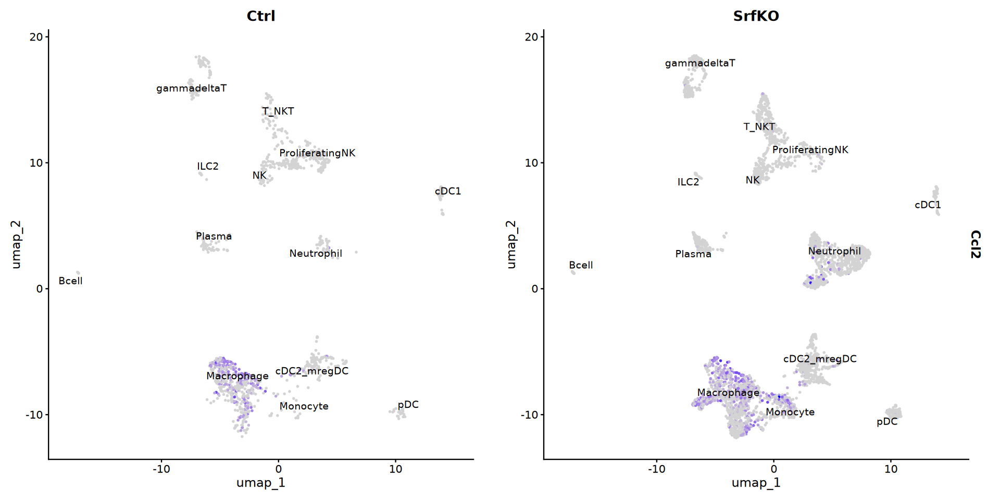

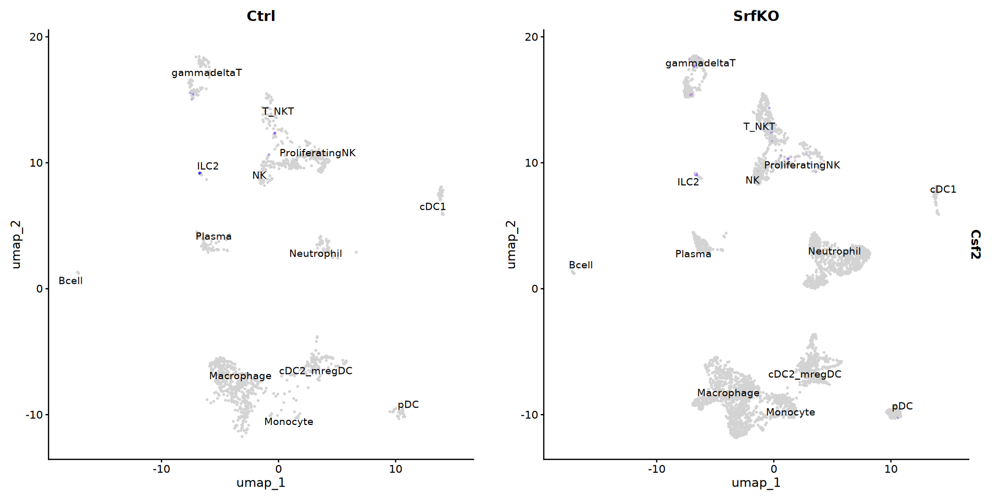

...

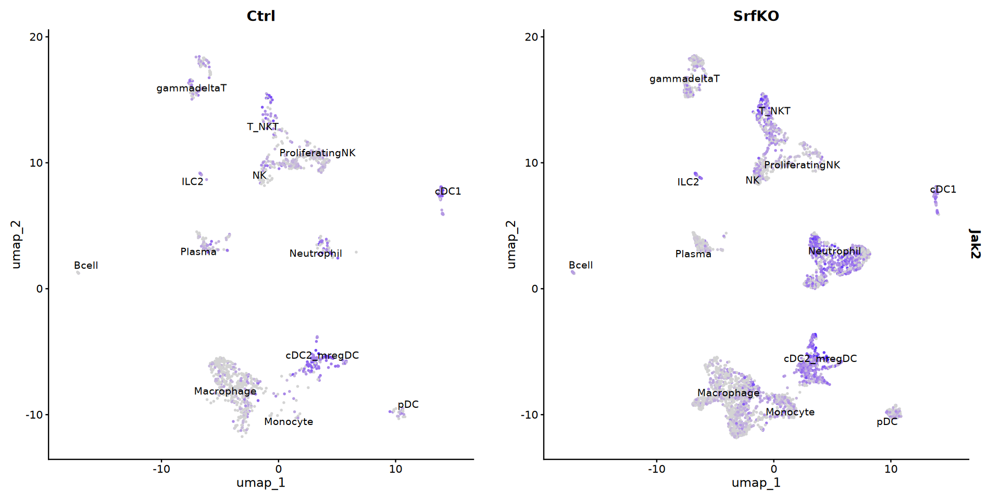

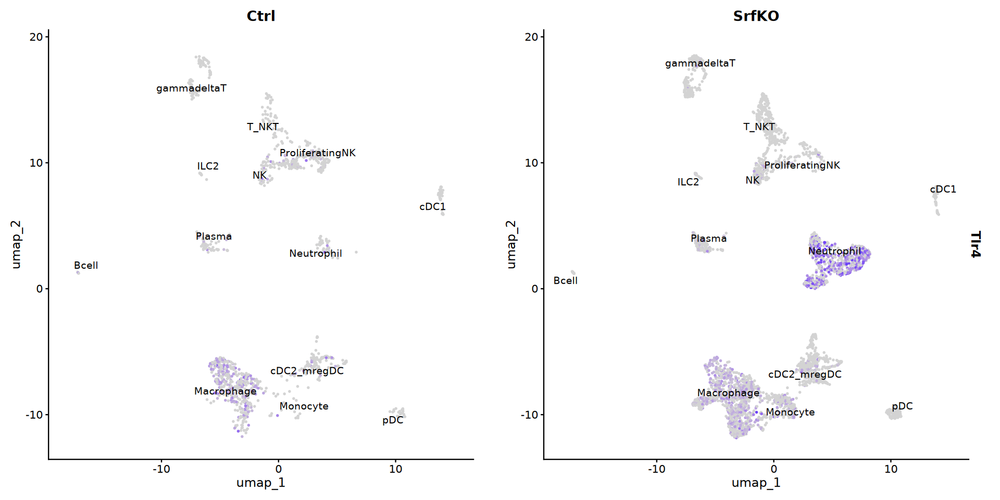

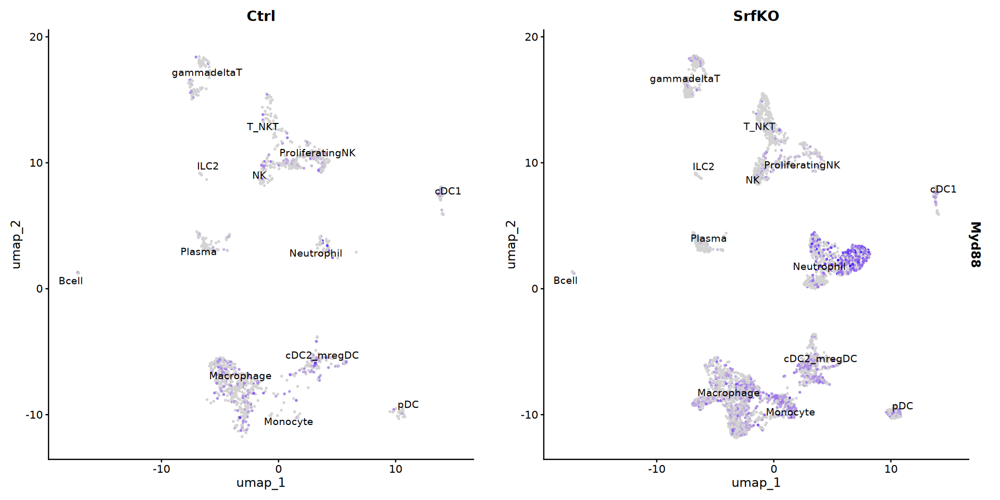

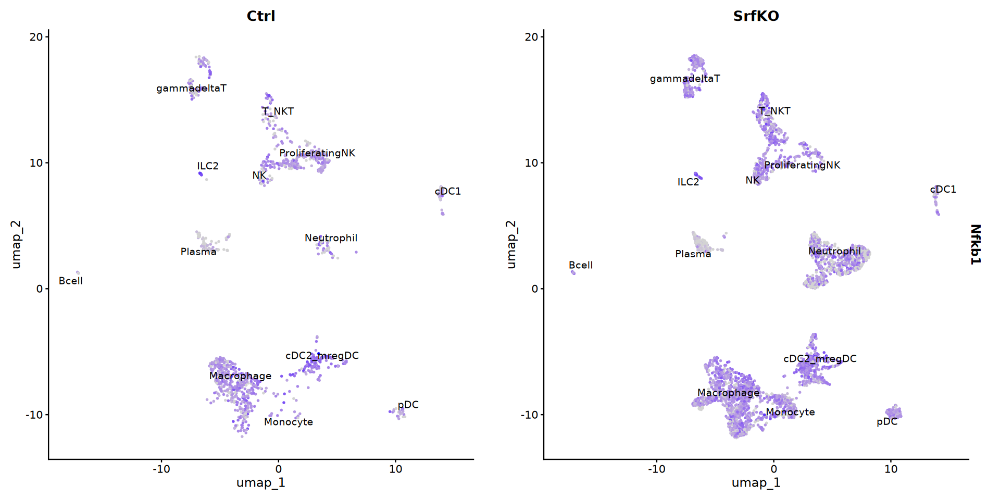

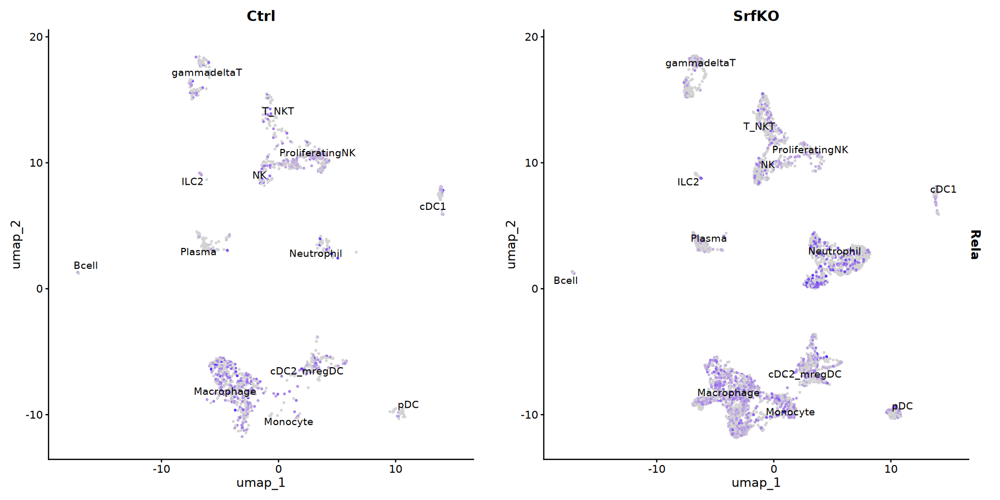

In [191]:
# plot more macrophage markers (see https://www.frontiersin.org/journals/immunology/articles/10.3389/fimmu.2019.01084/full)
# split by genotype and label

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

#M1

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Acod1'), #Irg1
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cd40'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ptgs2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ccl2'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Csf2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Irf7'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ifit2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Irf9'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ifi35'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ifnar2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Isg20'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ifih1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Il12a'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Il12b'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Jak2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Tlr4'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Myd88'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Nfkb1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Rela'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

options(saved) # restore old settings


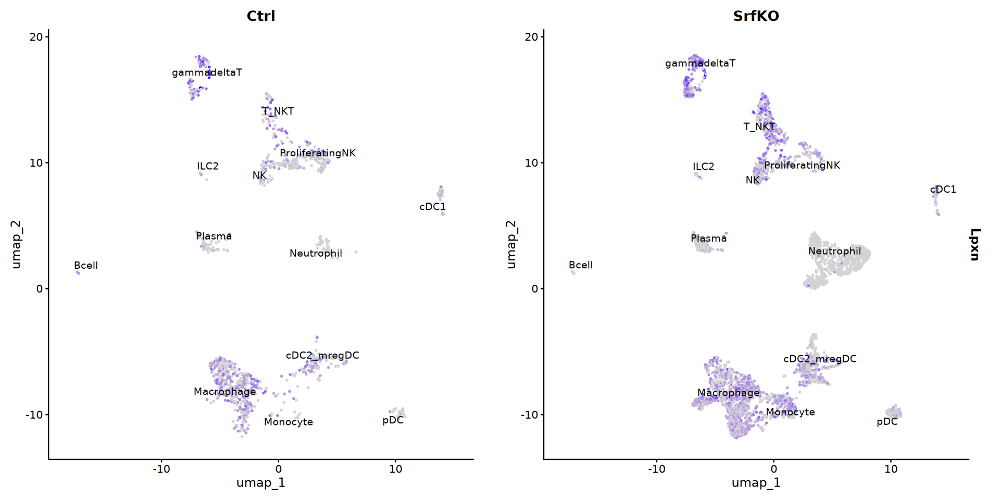

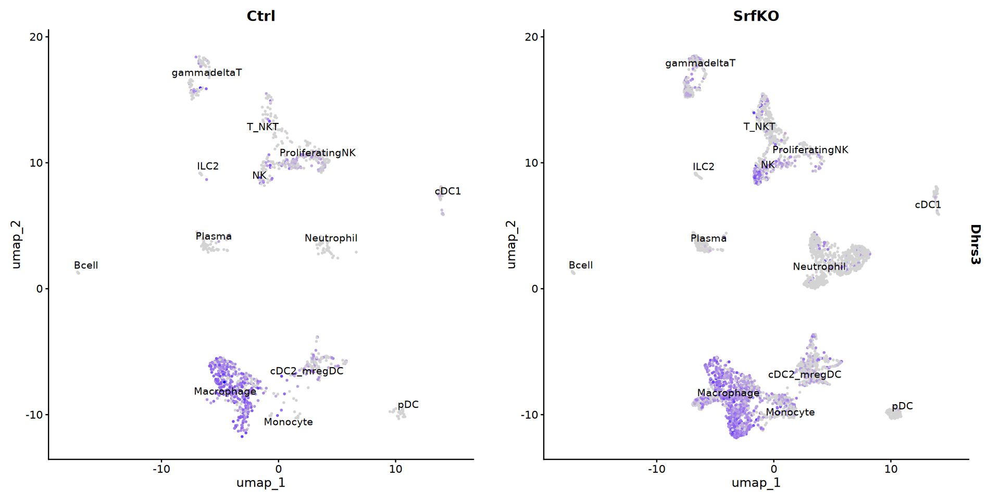

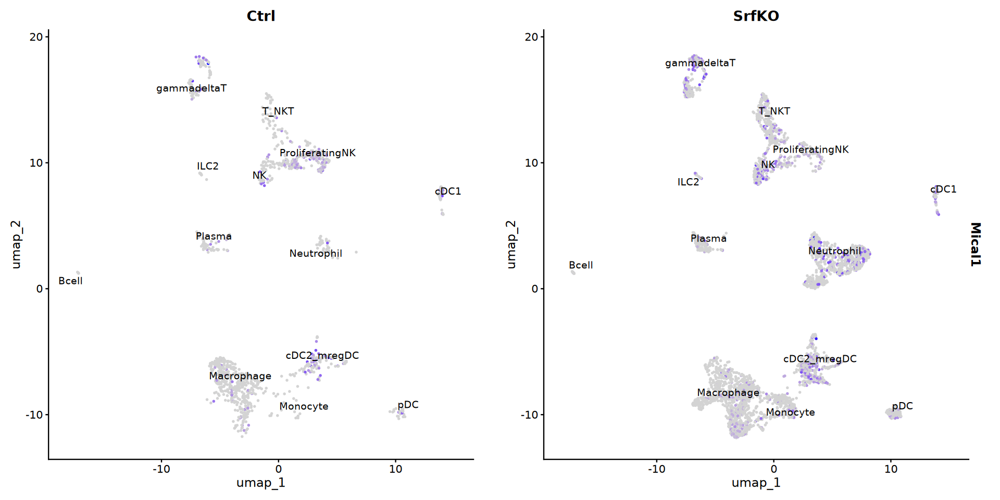

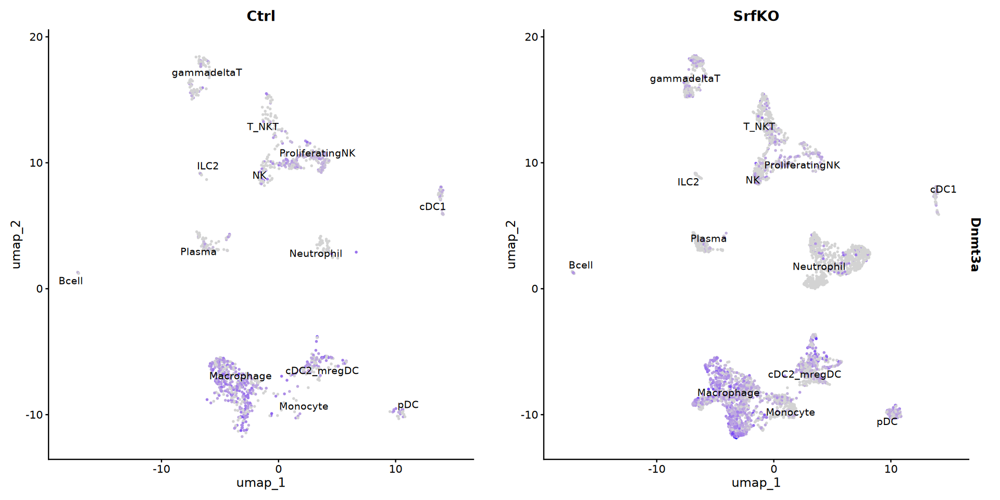

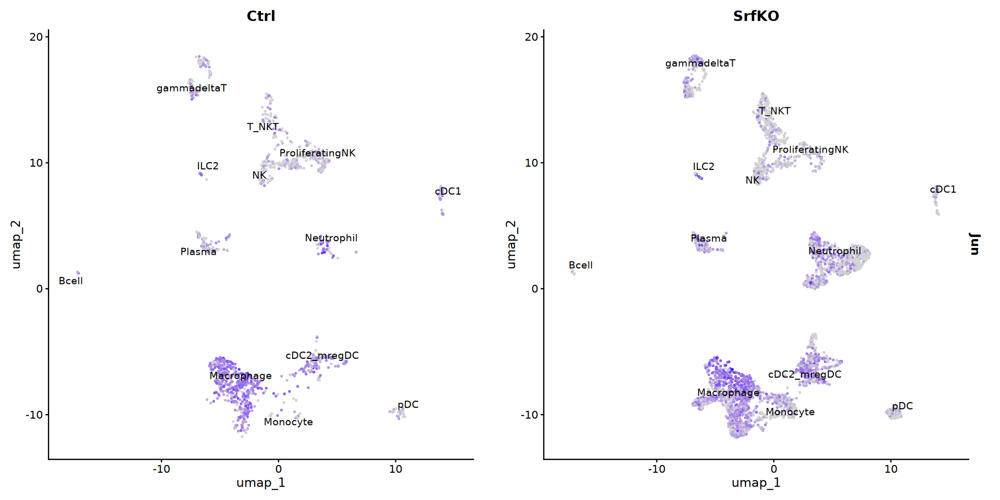

...

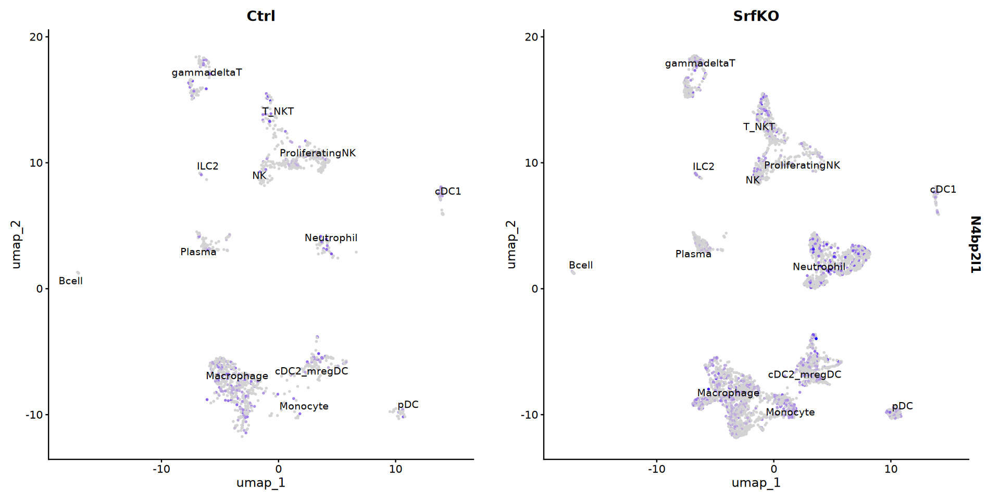

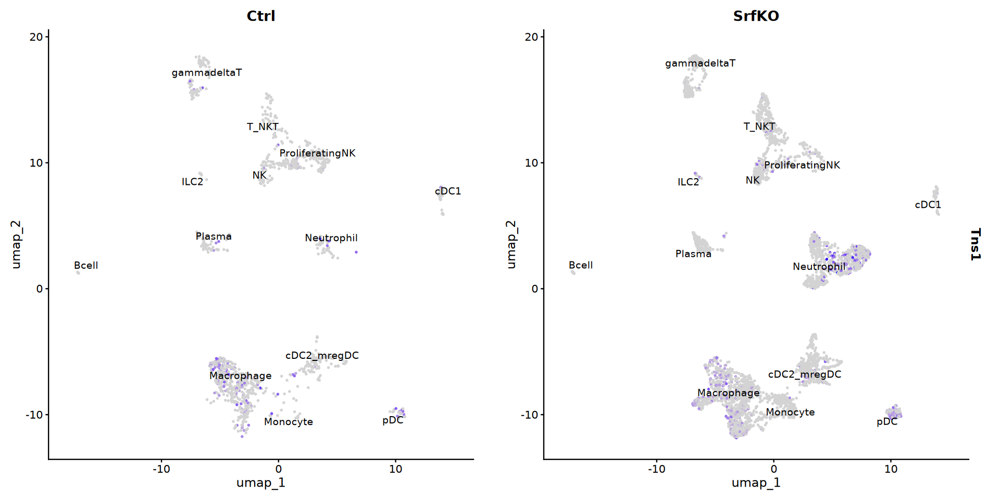

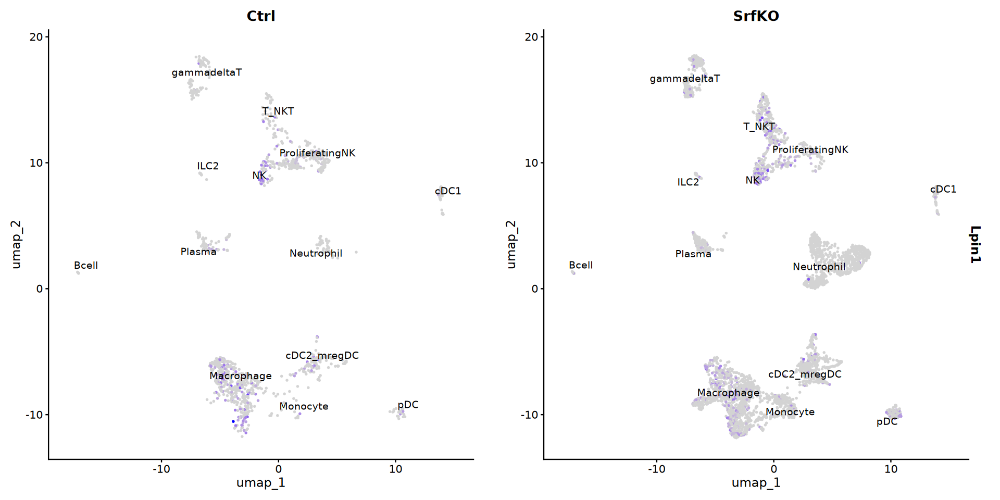

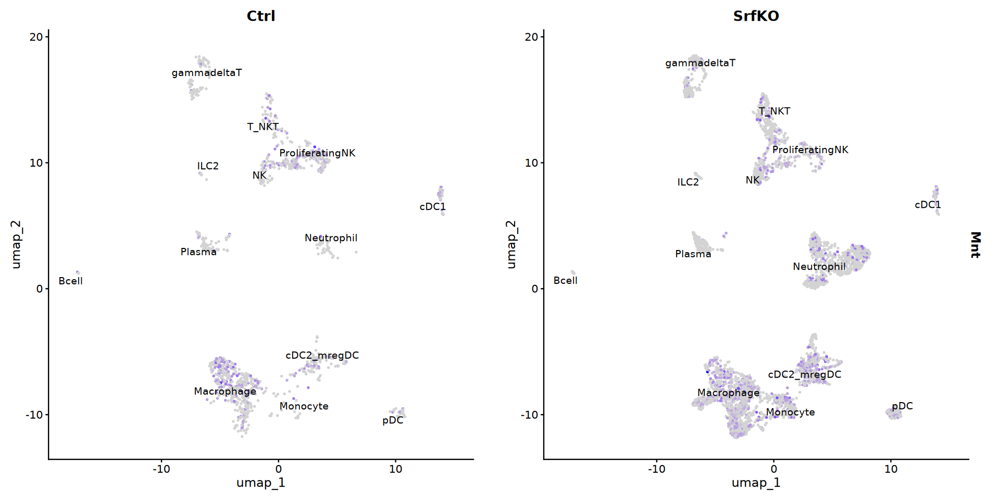

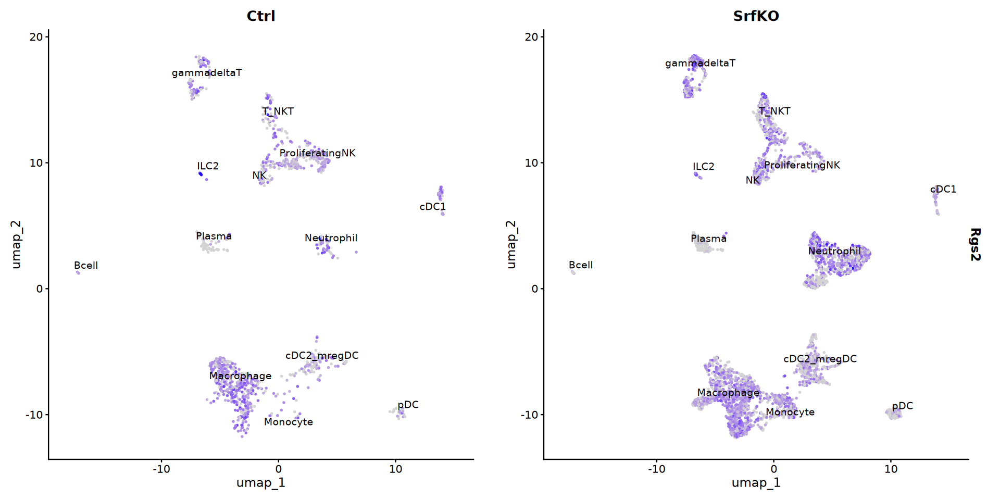

In [192]:
# plot more macrophage markers (see https://www.frontiersin.org/journals/immunology/articles/10.3389/fimmu.2019.01084/full)
# split by genotype and label

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

#M2

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Lpxn'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Dhrs3'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Mical1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Dnmt3a'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Jun'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Gab1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('P2ry1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Fbxo32'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Cebpa'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Gadd45g'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('N4bp2l1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Tns1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Lpin1'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Mnt'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Rgs2'),
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

options(saved) # restore old settings


Warning message:
“All cells have the same value (0) of “Ly6g””


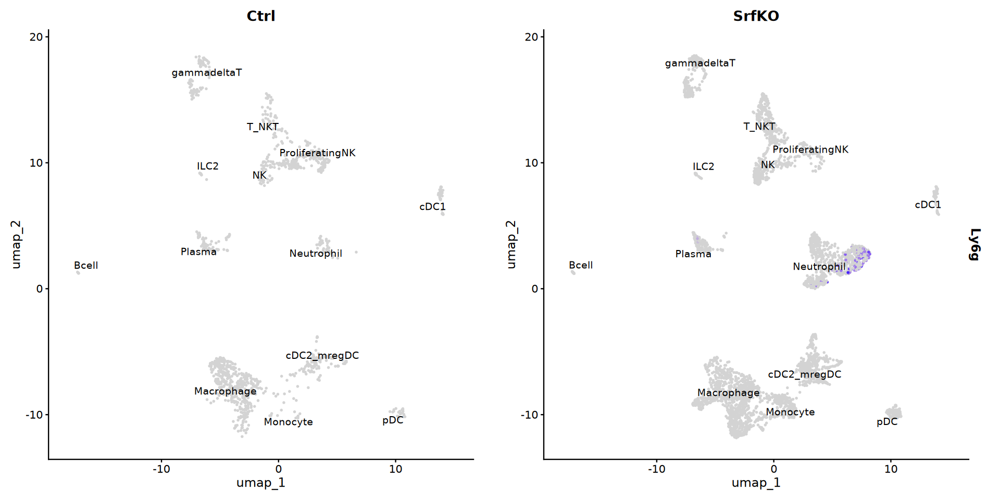

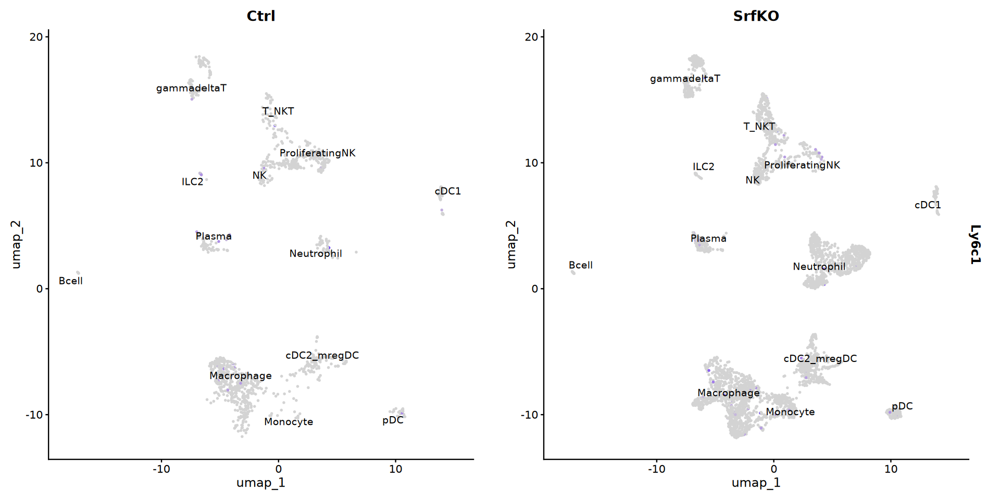

In [187]:
# plot monocyte/neutrophil markers - better done as surface labeling than gene expression
# split by genotype and label

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

# General

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ly6g'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Ly6c1'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

options(saved) # restore old settings


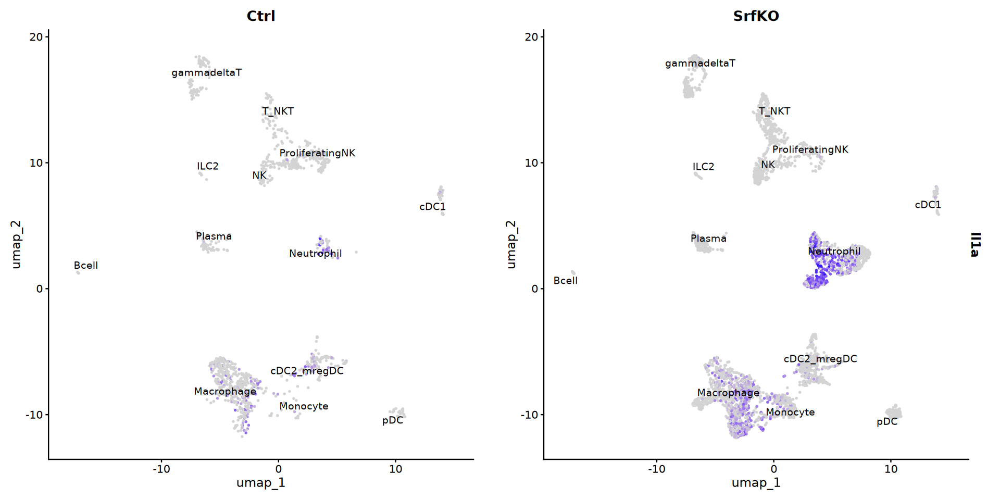

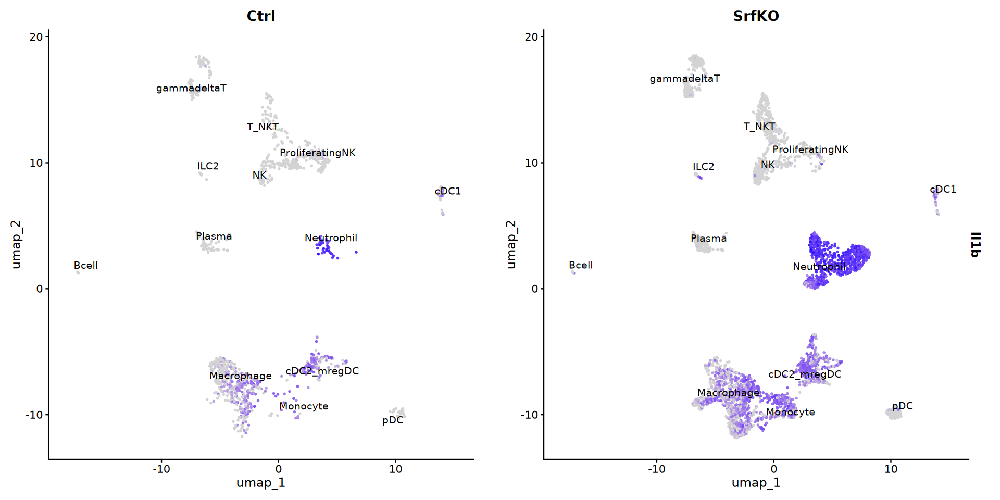

In [196]:
# plot IL1 genes
# split by genotype and label

Idents(Adult_Srfflox_SrfKO_immune) <- Adult_Srfflox_SrfKO_immune$ImmuneSubtype

saved <- options(repr.plot.width = 16, repr.plot.height = 8) # Make the plots bigger from here on out, save old options

# General

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Il1a'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

FeaturePlot(Adult_Srfflox_SrfKO_immune, features = c('Il1b'), 
            pt.size=0.5,
            label=TRUE,
            repel = TRUE,
            split.by="genotype")

options(saved) # restore old settings
